# Neural Bandit Algorithm Evaluation Framework

## Graduate Research Project
**AI & Quantum Computing Laboratory**  
**Rochester Institute of Technology**

---

## Research Framework Overview

This comprehensive evaluation framework provides rigorous analysis of neural bandit algorithms with clear categorical distinction between different operational environments:

- **Baseline Environment**: Optimal performance benchmark (Oracle)
- **Stochastic Environment**: Natural random failures and network noise
- **Adversarial Environment**: Strategic intelligent attacks and malicious targeting

## Primary Research Questions

1. **Algorithm Robustness**: How do neural bandit algorithms perform across different threat models?
2. **Comparative Analysis**: Which algorithms demonstrate superior performance in specific scenarios?
3. **Quantified Performance**: What are the exact degradation metrics under adversarial conditions?
4. **Theoretical Validation**: Do experimental results align with established regret bounds?

## Key Research Contributions

- **Systematic Environment Categorization**: Clear baseline/stochastic/adversarial taxonomy
- **Multi-Algorithm Comparative Testing**: Comprehensive evaluation across 6+ algorithms
- **Quantified Robustness Metrics**: Precise performance degradation measurements
- **Publication-Ready Analysis**: Academic-quality visualizations and statistical validation

## Evaluation Methodology

The framework implements standardized testing protocols across three distinct categories:
- **Baseline**: Oracle performance establishing theoretical upper bounds
- **Stochastic**: Random environmental perturbations modeling realistic conditions  
- **Adversarial**: Strategic attack scenarios simulating malicious interference

Each algorithm undergoes identical testing conditions enabling direct performance comparison and robustness quantification across all operational environments.

## Threat Model Classification Framework

### Systematic Environment Taxonomy

This research framework establishes precise categorical distinctions for quantum network evaluation environments, addressing previous ambiguity in threat model classification:

### Environmental Categories

| Environment | Implementation | Threat Characteristic | Research Application |
|-------------|----------------|----------------------|---------------------|
| **Baseline** | `none` | Deterministic optimal performance | Theoretical upper bound |
| **Stochastic** | `stochastic`/`random` | Natural random failures | Realistic network conditions |
| **Adversarial** | `markov` | Oblivious strategic attacks | Pattern-based targeting |
| **Adversarial** | `adaptive` | Responsive strategic attacks | Feedback-driven targeting |
| **Adversarial** | `onlineadaptive` | Real-time strategic attacks | Dynamic threat adaptation |

### Research Contribution

This framework addresses a critical gap in existing literature where random network failures were often conflated with intentional adversarial attacks. The systematic categorization enables:

- **Precise Robustness Quantification**: Exact performance degradation measurements across threat categories
- **Comparative Algorithm Analysis**: Direct performance comparison under identical threat conditions
- **Theoretical Validation**: Empirical verification of regret bounds across different adversarial models
- **Reproducible Research Standards**: Standardized evaluation protocols for quantum network algorithms

### Methodological Significance

Previous research often lacked clear distinction between stochastic and adversarial environments, limiting the ability to assess true algorithm robustness under intentional attacks versus natural network degradation. This framework provides the necessary precision for rigorous academic evaluation of quantum routing algorithms.

## Environment Setup & Library Installation

In [1]:
# ============================================================
# Setup: Quantum MAB Framework (Paper 7 QBGP Testbed)
# ============================================================

# --- Install Dependencies ---
!pip install -q torch torchvision numpy matplotlib seaborn pandas tqdm scipy scikit-learn pmdarima networkx

# --- Core Imports ---
import os, sys, gc, warnings, importlib, subprocess
import itertools
import numpy as np
import matplotlib.pyplot as plt
import torch
import networkx as nx
from pathlib import Path

warnings.filterwarnings('ignore')

# --- Path Setup ---
print(f"Current working directory: {os.getcwd().split('/')[-1]}")
try:
    import google.colab
    from google.colab import drive
    drive.mount('/content/drive')
    project_dir = '/content/drive/MyDrive/GA-Work/hybrid_variable_framework/Dynamic_Routing_Eval_Framework'
    os.chdir(project_dir)
    print("Running in Google Colab")
except ImportError:
    print("Running locally (not in Colab)")
    # Navigate to the correct directory for local execution
    current_dir = os.getcwd()
    if 'GA-Work' in current_dir and 'Dynamic_Routing_Eval_Framework' not in current_dir:
        project_dir = os.path.join(current_dir, 'hybrid_variable_framework', 'Dynamic_Routing_Eval_Framework')
        if os.path.exists(project_dir):
            os.chdir(project_dir)
            print(f"Changed to project directory: {os.getcwd().split('/')[-1]}")

# Add necessary paths for daqr package discovery
sys.path.append(os.path.join(os.getcwd(), 'src'))
sys.path.append(os.getcwd())  # Add current directory to find daqr package

print(f"Now working from: {os.getcwd().split('/')[-1]}")

# --- Framework Verification ---
print("Framework dependencies installed successfully")
print(f"Python version: {sys.version.split()[0]}")
print(f"PyTorch version: {torch.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"NetworkX version: {nx.__version__}")
print(f"Matplotlib version: {plt.matplotlib.__version__}")
print("Quantum MAB Models Evaluation Framework - Ready for Paper 7 (QBGP) testing")

# --- Cleanup Script Execution ---
root = os.path.abspath("../..")
cleanup_script = os.path.join(root, "cleanup_state_duplicates.py")
if os.path.exists(cleanup_script):
    print(f"\n🚿 Running cleanup script at: {cleanup_script}\n")
    result = subprocess.run(["python3", cleanup_script], text=True, capture_output=True)
    print("===== CLEANUP STDOUT =====\n", result.stdout)
    print("===== CLEANUP STDERR =====\n", result.stderr)
else:
    print("⚠️ Cleanup script not found, skipping...")

# --- Deep Cleanup ---
def deep_cleanup():
    to_clear = ["oracle", "gneuralucb", "expneuralucb", "cpursuitneuralucb",
                "icpursuitneuralucb", "evaluator", "results"]
    for name in to_clear:
        if name in globals():
            obj = globals().get(name)
            if hasattr(obj, "cleanup"): obj.cleanup(verbose=False)
            globals().pop(name, None)
    gc.collect()
    torch.set_default_dtype(torch.float32)
    if torch.cuda.is_available(): torch.cuda.empty_cache()
    print("✓ Deep cleanup complete (memory cleared)")

deep_cleanup()

# Ensure daqr package is discoverable
PARENT_DIR = os.path.abspath("..")
if PARENT_DIR not in sys.path:
    sys.path.insert(0, PARENT_DIR)
    
# Verify daqr package can be found
try:
    import daqr
    print("✓ daqr package found successfully")
except ImportError as e:
    print(f"❌ daqr package not found: {e}")
    print(f"Current directory: {os.getcwd()}")
    print(f"Python path includes: {[p for p in sys.path if 'GA-Work' in p or 'daqr' in p]}")
    print("Please ensure you're running from the Dynamic_Routing_Eval_Framework directory")

# --- Final Module Setup ---
from daqr.core.quantum_physics              import (MemoryNoiseModel, FullPaper2FidelityCalculator)
from daqr.evaluation                        import experiment_runner, multi_run_evaluator, visualizer
from daqr.config                            import experiment_config
from daqr.algorithms                        import base_bandit, neural_bandits, predictive_bandits
from daqr.core                              import network_environment, qubit_allocator
from daqr.config.experiment_config          import ExperimentConfiguration
from experiments                            import stochastic_evaluation
from daqr.core.network_environment          import *
from daqr.core.qubit_allocator              import *
from daqr.algorithms.base_bandit            import *
from daqr.algorithms.neural_bandits         import *
from daqr.algorithms.predictive_bandits     import *
from daqr.evaluation.multi_run_evaluator    import *
from daqr.evaluation.experiment_runner      import *

# ============================================================================
# PAPER-SPECIFIC IMPORTS
# ============================================================================
from daqr.core.topology_generator           import Paper2TopologyGenerator
from daqr.core.topology_generator           import Paper7ASTopologyGenerator  # 🆕 Paper 7
from daqr.core.topology_generator           import Paper12WaxmanTopologyGenerator
from daqr.core.quantum_physics              import FiberLossNoiseModel
from daqr.core.quantum_physics              import FusionNoiseModel, FusionFidelityCalculator
from daqr.core.quantum_physics              import Paper12RetryFidelityCalculator
from daqr.core.quantum_physics              import Paper7RewardFunction  # 🆕 Paper 7
from daqr.core                              import attack_strategy

print("✓ All modules reloaded successfully (Paper 7 environment ready)")

# --- Config & Model Setup ---
for module in [experiment_config, network_environment, qubit_allocator, attack_strategy, base_bandit, 
               neural_bandits, predictive_bandits, experiment_runner, multi_run_evaluator, visualizer, 
               stochastic_evaluation]:
    importlib.reload(module)

config = ExperimentConfiguration()
models = config.NEURAL_MODELS

# ============================================================================
# FRAMEWORK CONFIGURATION
# ============================================================================
# Unified paper settings schema (same keys for paper2, paper7, paper12)
COMMON_PAPER_SETTINGS = {
    # identity
    "testbed": None,

    # framework
    "num_paths": None,
    "total_qubits": None,
    "min_qubits_per_route": None,
    "exploration_bonus": None,

    # topology/routing
    "topology_type": None,
    "num_nodes": None,
    "n_nodes": None,
    "max_nodes": None,
    "avg_degree": None,
    "source_node": None,
    "dest_node": None,
    "k": None,
    "n_qisps": None,
    "topology_path": None,
    "network_scale": None,
    "largest_cc_only": None,
    "relabel_to_int": None,
    "use_synthetic": None,
    "synthetic_kind": None,
    "synthetic_params": None,

    # paper2 physics
    "p_init": None,
    "f_attenuation": None,
    "p_BSM": None,
    "p_GateErrors": None,
    "p_depol": None,
    "r_dephase": None,
    "c_light": None,
    "t_BSM": None,
    "t_d": None,
    "refractive_index": None,
    "memory_T2": None,
    "swap_mode": None,
    "swap_delay_per_link": None,
    "gate_error_rate": None,
    "use_gate_error": None,
    "use_memory_decay": None,
    "use_paper2_rewards": None,
    "transition_trigger": None,
    "paper2_transition_interval": None,
    "entanglement_success_factor": None,
    "rounds": None,
    "experiments": None,

    # paper7
    "use_context_rewards": None,
    "reward_mode": None,

    # paper12 / QuARC
    "channel_width": None,
    "fusion_prob": None,
    "qubits_per_node": None,
    "entanglement_prob": None,
    "num_sd_pairs": None,
    "epoch_length": None,
    "total_timeslots": None,
    "split_constant": None,
    "enable_clustering": None,
    "enable_secondary_fusions": None,
    "use_dynamic_thresholding": None,
    "use_fusion_rewards": None,
    "time_decay_physics": None,
    "cutoff": None,

    # retry controls
    "retry_threshold": None,
    "max_retry_attempts": None,
    "retry_decay_rate": None,
    "enable_retry_logging": None,
    "retry_cost_per_attempt": None,
}

PAPER_SETTINGS = {
    "paper2": {
        **COMMON_PAPER_SETTINGS,
        "testbed": "paper2",
        "num_paths": 8,
        "num_nodes": 15,
        "source_node": 1,
        "dest_node": 14,
        "total_qubits": 35,
        "min_qubits_per_route": 2,
        "exploration_bonus": 2.0,
        "p_init": 1e-5,
        "f_attenuation": 0.05,
        "p_BSM": 0.2,
        "p_GateErrors": 0.2,
        "r_dephase": 10000,
        "c_light": 3.0e8,
        "t_BSM": 10e-9,
        "t_d": 10e-9,
        "refractive_index": 1.5,
        "use_paper2_rewards": True,
        "rounds": 1200,
        "experiments": 100,
    },
    "paper7": {
        **COMMON_PAPER_SETTINGS,
        "testbed": "paper7",
        "k": 5,
        "n_qisps": 3,
        "num_paths": 4,
        "max_nodes": 50,
        "network_scale": "small",
        "topology_path": "/Users/pitergarcia/DataScience/Semester4/GA-Work/hybrid_variable_framework/Dynamic_Routing_Eval_Framework/daqr/core/topology_data/as20000101.txt",
        "total_qubits": 35,
        "min_qubits_per_route": 2,
        "exploration_bonus": 2.0,
        "use_context_rewards": True,
        "reward_mode": "neg_hop",
        "use_synthetic": False,
        "largest_cc_only": True,
        "relabel_to_int": True,
        "synthetic_kind": "barabasi_albert",
        "synthetic_params": {"n": 50, "m": 3},
    },
    "paper12": {
        **COMMON_PAPER_SETTINGS,
        "testbed": "paper12",
        "topology_type": "waxman_qcast",
        "n_nodes": 100,
        "avg_degree": 6,
        "entanglement_prob": 0.6,
        "fusion_prob": 0.9,
        "num_sd_pairs": 10,
        "epoch_length": 500,
        "total_timeslots": 7000,  # pick one canonical value
        "split_constant": 4,
        "enable_clustering": True,
        "enable_secondary_fusions": True,
        "use_dynamic_thresholding": True,
        "num_paths": 4,
        "total_qubits": 120,
        "min_qubits_per_route": 3,
        "exploration_bonus": 1.5,
        "use_fusion_rewards": True,
        "time_decay_physics": {"memory_lifetime": 0.5},
        "retry_threshold": 0.7,
        "max_retry_attempts": 3,
        "retry_decay_rate": 0.95,
        "enable_retry_logging": True,
        "retry_cost_per_attempt": 0.1,
    },
}

FRAMEWORK_CONFIG = {
    # Testing Configuration (lightweight for development)
    'test_mode': True,  # Set to False for final comprehensive evaluation
    'base_frames': 4000,    # Quick testing (increase to 4000+ for final runs)
    'exp_num': 3,  # Fast iteration (increase to 10+ for statistical significance)
    'frame_step': 2000,
    'models': models,
    'intensity': 0.25,  # Natural failure rate for stochastic
    
    # Production Configuration (for final evaluation)
    'prod_frames': 4000,     # Full evaluation frames
    'prod_experiments': 10,  # Statistical significance
    'frame_steps': [],  # Multi-horizon testing
    
    # Primary evaluation focus
    'main_env': 'stochastic',
    'eval_mod': 'comprehensive',
    'main_model': 'CEXPNeuralUCB',
    
    # Routing strategy configuration (NEW)
    'routing_strategy': 'fixed',  # 'fixed' or 'dynamic'
    'enable_routing_comparison': False,  # Enable for routing paper

    **PAPER_SETTINGS,

      # Algorithm parameters (EXPNeuralUCB paper-compliant)
    'alg_attrs': {
        'lambda_reg': 1.0,      # Regularization parameter
        'gamma': 0.1,           # EXP3 exploration rate  
        'network_width': 128,   # Neural network width
        'network_depth': 2,     # Neural network depth
        'gradient_steps': 8,    # Gradient descent steps
        'learning_rate': 1e-4   # Learning rate
    },

    # Environment parameters
    'env_attrs': {
        'intensity': 0.25,  # Natural failure rate for stochastic
        'base_seed': 12345,
        'reproducible': True
    },

    # Test scenarios for different evaluation modes
    'scenarios': {
        'exp_focus': ['stochastic'],  # Primary focus
        'stochastic_vs_baseline': ['none', 'stochastic'], # Comparison
        'comprehensive': ['none', 'stochastic', 'markov', 'adaptive'], # Full evaluation
        'adversarial': ['markov', 'adaptive', 'onlineadaptive']  # Future use
    }
}

FRAMEWORK_CONFIG['intensity'] = FRAMEWORK_CONFIG['env_attrs']['intensity']

# Define evaluation scenarios based on framework focus
if FRAMEWORK_CONFIG['main_env'] == 'stochastic':
    # Primary stochastic evaluation with optional comparison
    test_scenarios = {
        'stochastic': 'Stochastic Random Failures',
        'markov': 'Markov Adversarial Attack',
        'adaptive': 'Adaptive Adversarial Attack',
        'onlineadaptive': 'Online Adaptive Attack',
        'none': 'Baseline (Optimal Conditions)'  # For comparison
    }
    evaluation_type = "STOCHASTIC-FOCUSED"
else:
    # Fallback to stochastic vs adversarial for comparison
    test_scenarios = {
        'stochastic': 'Stochastic (Natural Network Failures)', 
        'adaptive': 'Adversarial (Strategic Attacks)'
    }
    evaluation_type = "COMPARATIVE"
    
# Calculate frame steps
for exp_id in range(0, FRAMEWORK_CONFIG['exp_num']):
    FRAMEWORK_CONFIG['frame_steps'].append(
        FRAMEWORK_CONFIG['base_frames'] + (FRAMEWORK_CONFIG['frame_step'] * exp_id)
    )
FRAMEWORK_CONFIG['capacity'] = 10000 # quantum paper default capacity

# Dynamic configuration based on testing mode
attack_intensity= FRAMEWORK_CONFIG['intensity']
frame_step = FRAMEWORK_CONFIG['frame_step']
current_frames = (FRAMEWORK_CONFIG['base_frames'] if FRAMEWORK_CONFIG['test_mode'] 
                  else FRAMEWORK_CONFIG['prod_frames'])
current_experiments = (FRAMEWORK_CONFIG['exp_num'] if FRAMEWORK_CONFIG['test_mode'] 
                       else FRAMEWORK_CONFIG['prod_experiments'])

# Display current configuration
print("=" * 70)
print("DYNAMIC ROUTING EVALUATION FRAMEWORK - CONFIGURATION")
print("=" * 70)
print(f"Models to evaluate: {len(models)} total")
print(f"Primary environment: {FRAMEWORK_CONFIG['main_env'].upper()}")
print(f"Routing strategy: {FRAMEWORK_CONFIG['routing_strategy'].upper()}")

print(f"\nCURRENT SETTINGS ({'TESTING' if FRAMEWORK_CONFIG['test_mode'] else 'PRODUCTION'} MODE):")
print(f"  • Frames per run: {current_frames}")
print(f"  • Experiments per model: {current_experiments}")
print(f"  • Expected runtime: {'~2-3 minutes' if FRAMEWORK_CONFIG['test_mode'] else '~30-45 minutes'}")

print(f"\nALGORITHM PARAMETERS:")
for key, value in FRAMEWORK_CONFIG['alg_attrs'].items():
    print(f"  • {key}: {value}")

print(f"\nENVIRONMENT PARAMETERS:")
for key, value in FRAMEWORK_CONFIG['env_attrs'].items():
    print(f"  • {key}: {value}")

print(f"\nAVAILABLE TEST SCENARIOS:")
for scenario_name, environments in FRAMEWORK_CONFIG['scenarios'].items():
    print(f"  • {scenario_name}: {environments}")

print("\n" + "=" * 70)
print("DEVELOPMENT STRATEGY:")
if FRAMEWORK_CONFIG['test_mode']:
    print("✓ TESTING MODE - Fast iteration for development and debugging")
    print("  Switch test_mode to False for final comprehensive evaluation")
else:
    print("✓ PRODUCTION MODE - Full statistical evaluation")

if FRAMEWORK_CONFIG['enable_routing_comparison']:
    print("\n✓ ROUTING COMPARISON ENABLED")
    print("  Framework will compare Fixed vs Dynamic routing strategies")
    
print("=" * 70)


Current working directory: GA-Work
Running locally (not in Colab)
Changed to project directory: Dynamic_Routing_Eval_Framework
Now working from: Dynamic_Routing_Eval_Framework
Framework dependencies installed successfully
Python version: 3.12.11
PyTorch version: 2.8.0
NumPy version: 1.26.4
NetworkX version: 3.5
Matplotlib version: 3.10.6
Quantum MAB Models Evaluation Framework - Ready for Paper 7 (QBGP) testing
⚠️ Cleanup script not found, skipping...
✓ Deep cleanup complete (memory cleared)
✓ daqr package found successfully
PyTorch version: 2.8.0
NumPy version: 1.26.4
Using device: cpu
PyTorch version: 2.8.0
NumPy version: 1.26.4
Using device: cpu
✓ All modules reloaded successfully (Paper 7 environment ready)
PyTorch version: 2.8.0
NumPy version: 1.26.4
Using device: cpu
PyTorch version: 2.8.0
NumPy version: 1.26.4
Using device: cpu

===================== GET LOCAL REGISTRY =====================
→ Skipping local cache (force=True or file missing)

===================== BUILD LOCAL RE

## Comparative Analysis Framework: Stochastic versus Adversarial Environments

### Research Focus

This evaluation constitutes the primary empirical contribution of the research: systematic quantification of algorithm performance across fundamentally different operational conditions that distinguish between natural system failures and intentional strategic attacks.

### Environmental Characterization

**Stochastic Environment**
- **Operational Model**: Natural random failures representing realistic network degradation patterns
- **Attack Distribution**: Probabilistic failures following uniform random distribution
- **Research Significance**: Establishes baseline performance metrics under standard operational conditions

**Adversarial Environment**  
- **Operational Model**: Strategic intelligent attacks systematically targeting algorithmic decision-making processes
- **Attack Distribution**: Adaptive targeting mechanisms that dynamically respond to observed algorithm behavior
- **Research Significance**: Evaluates robustness under worst-case strategic threat scenarios

### Experimental Predictions

Based on the theoretical analysis and algorithm architecture, the following empirical outcomes are anticipated:

**Performance Superiority Hypothesis**
EXPNeuralUCB will demonstrate measurably superior performance retention in adversarial environments relative to baseline neural bandit algorithms lacking specialized adversarial robustness mechanisms.

**Bounded Degradation Hypothesis**
Performance degradation under adversarial conditions will remain within acceptable operational limits, specifically maintaining performance within 85% of stochastic environment baselines.

**Stability Hypothesis**
Algorithm performance rankings will exhibit stability across varying adversarial attack intensities, indicating consistent robustness characteristics rather than scenario-dependent performance fluctuations.

### Research Methodology

The comparative analysis employs identical experimental conditions across both environments, enabling precise quantification of performance degradation attributable to adversarial targeting while controlling for environmental variables and maintaining statistical rigor in the evaluation process.

In [2]:
# ============================================================================
# PAPER 7 HELPER FUNCTIONS
# ============================================================================
from daqr.core.quantum_physics import AdaptedPaper2FidelityCalculator, StochasticPaper2NoiseModel


def generate_paper7_paths(topology, k: int, n_qisps: int, seed: int):
    """Generate k-shortest paths between n_qisps ISP nodes."""
    rng = np.random.default_rng(seed)
    nodes = list(topology.nodes())

    if len(nodes) < n_qisps: raise ValueError(f"Topology has {len(nodes)} nodes, need {n_qisps} for ISPs")
    isp_nodes = rng.choice(nodes, size=n_qisps, replace=False)
    all_paths = []

    for src, dst in itertools.combinations(isp_nodes, 2):
        try:
            path_generator = nx.shortest_simple_paths(topology, src, dst, weight='distance')
            paths = list(itertools.islice(path_generator, k))
            all_paths.extend(paths)
        except nx.NetworkXNoPath:   continue
    return all_paths


def generate_paper7_contexts(paths, topology):
    """Generate context vectors for each path (hop_count, avg_degree, path_length)."""
    contexts = []
    
    for path in paths:
        hop_count = len(path) - 1
        degrees = [topology.degree(node) for node in path]
        avg_degree = sum(degrees) / len(degrees) if degrees else 0.0

        path_length = 0.0
        for i in range(len(path) - 1):
            edge_data = topology.get_edge_data(path[i], path[i+1])
            path_length += edge_data.get('distance', 1.0)

        context_vector = np.array([hop_count, avg_degree, path_length])
        contexts.append([context_vector])
    return contexts


def get_physics_params_paper12(config, seed, qubit_cap):
    """
    Paper #12 (Waxman + QuARC) physics adapter.
    Returns: {external_topology, external_contexts, external_rewards, noise_model, fidelity_calculator}
    """
    topology = Paper12WaxmanTopologyGenerator().generate()
    num_paths = 4
    nodes = list(topology.nodes())
    rng = np.random.default_rng(seed)

    # Find 4 paths
    paths = []
    attempts = 0
    max_attempts = 10 * num_paths
    
    while len(paths) < num_paths and attempts < max_attempts:
        attempts += 1
        src, dst = rng.choice(nodes, 2, replace=False)
        try:
            path = nx.shortest_path(topology, src, dst)
            if path not in paths:   paths.append(path)
        except nx.NetworkXNoPath:   continue
    if len(paths) < num_paths:  raise RuntimeError(f"Could not find {num_paths} valid paths in Waxman topology")

    # Physics models
    fusion_prob = float(config.get("fusion_prob", 0.9))
    entanglement_prob = float(config.get("entanglement_prob", 0.6))
    noise_model = FusionNoiseModel(topology=topology, paths=paths, fusion_prob=fusion_prob, entanglement_prob=entanglement_prob)
    fidelity_calc = FusionFidelityCalculator()
    reward_func = QuARCRewardFunction()

    # Contexts: 4 arrays with shapes (8,3), (10,3), (8,3), (9,3)
    external_contexts = []
    arms_per_path = [8, 10, 8, 9]
    degrees = dict(topology.degree())
    max_degree = max(degrees.values()) if degrees else 1.0

    for p_idx, K in enumerate(arms_per_path):
        path = paths[p_idx]
        hop_count = len(path) - 1
        path_degrees = [degrees[n] for n in path]
        avg_degree = float(sum(path_degrees) / len(path_degrees))
        f2_deg_norm = avg_degree / max_degree if max_degree > 0 else 0.0
        ctx = np.full((K, 3), [float(hop_count), f2_deg_norm, fusion_prob], dtype=float)
        external_contexts.append(ctx)

    # Rewards: 4 lists with lengths [8,10,8,9]
    external_rewards = []
    for p_idx, K in enumerate(arms_per_path):
        path = paths[p_idx]
        err_info = noise_model.get_error_rates(p_idx)
        base_fidelity = fidelity_calc.compute_path_fidelity(err_info, context=None, fusion_prob=fusion_prob)
        base_fidelity = float(np.clip(base_fidelity, 0.0, 1.0))

        path_rewards = []
        for _ in range(K):
            success = rng.random() < base_fidelity
            r = reward_func.compute_reward(success=success, aggregate_throughput=1)
            path_rewards.append(float(r))
        
        external_rewards.append(path_rewards)
    return {
        "external_topology": topology, "external_contexts": external_contexts,
        "external_rewards": external_rewards, "noise_model": noise_model, "fidelity_calculator": fidelity_calc,
    }


def get_physics_params(
    physics_model: str = "default",
    current_frames: int = 4000,
    base_seed: int = 42,
    qubit_cap=None,
    *,
    topology: "nx.Graph | None" = None,
    topology_model: str | None = None,
    topology_path: str | Path | None = None,
    topology_max_nodes: int | None = None,
    topology_largest_cc_only: bool = True,
    topology_relabel_to_int: bool = True,
    synthetic_kind: str = "barabasi_albert",
    synthetic_params: dict | None = None,
):
    """Returns: {noise_model, fidelity_calculator, external_topology, external_contexts, external_rewards}"""

    if physics_model == "paper7":
        paper7_cfg = FRAMEWORK_CONFIG['paper7']
        node_num = paper7_cfg.get('max_nodes')

        if topology is not None:    final_topology = topology
        else:
            if paper7_cfg.get('use_synthetic', False) or not paper7_cfg.get('topology_path'):
                topo_gen = Paper7ASTopologyGenerator(
                    edge_list_path="dummy_nonexistent.txt",
                    max_nodes=topology_max_nodes or node_num,
                    seed=base_seed,
                    synthetic_fallback=True,
                    synthetic_kind="barabasi_albert",
                    synthetic_params={"n": node_num or 100, "m": 3}
                )
                print(f"📊 Paper7 Topology: Synthetic (Barabási-Albert, n={node_num or 100})")
            else:
                topo_gen = Paper7ASTopologyGenerator(
                    edge_list_path=paper7_cfg['topology_path'],
                    max_nodes=node_num,
                    seed=base_seed,
                    relabel_to_integers=topology_relabel_to_int,
                    largest_cc_only=topology_largest_cc_only,
                    synthetic_fallback=True
                )
                print(f"📊 Paper7 Topology: Real AS ({paper7_cfg['topology_path']})")
            final_topology = topo_gen.generate()

        k = paper7_cfg["k"]
        n_qisps = paper7_cfg["n_qisps"]
        paths = generate_paper7_paths(final_topology, k, n_qisps, base_seed)
        contexts = generate_paper7_contexts(paths, final_topology)
        print(f"📊 Paper7 Paths: {len(paths)} paths from {k}-shortest between {n_qisps} ISPs")

        external_rewards = None
        if paper7_cfg.get('use_context_rewards', False):
            reward_mode = paper7_cfg.get('reward_mode', 'neg_hop')
            reward_func = Paper7RewardFunction(mode=reward_mode)
            external_rewards = []
            for ctx_list in contexts:
                path_rewards = [reward_func.compute(ctx) for ctx in ctx_list]
                external_rewards.append(path_rewards)
            print(f"📊 Paper7 Rewards: Context-aware (mode={reward_mode})")
        else:   print(f"📊 Paper7 Rewards: Using default framework rewards")

        return {
            "noise_model": None,
            "fidelity_calculator": None,
            "external_topology": final_topology,
            "external_contexts": contexts,
            "external_rewards": external_rewards
        }
    
    elif physics_model == "paper2":
        p2_config = FRAMEWORK_CONFIG["paper2"]
        topo_gen = Paper2TopologyGenerator(num_nodes=p2_config["num_nodes"], seed=base_seed)
        topo = topo_gen.generate()
        
        try:
            path_generator = nx.shortest_simple_paths(topo, p2_config["source_node"], p2_config["dest_node"], weight="distance")
            paths = list(itertools.islice(path_generator, p2_config["num_paths"]))
        except nx.NetworkXNoPath:
            paths = [[p2_config["source_node"], p2_config["dest_node"]]] * p2_config["num_paths"]
        
        # ✅ NEW: Pass ALL Paper 2 physical constants to noise model
        noise_model = StochasticPaper2NoiseModel(
            topology=topo,
            paths=paths,
            p_init=p2_config.get("p_init", 0.00001),
            f_attenuation=p2_config.get("f_attenuation", 0.05),
            p_BSM=p2_config.get("p_BSM", 0.2),
            p_GateErrors=p2_config.get("p_GateErrors", 0.2),
            p_depol=p2_config.get("p_depol", 0.1),
            # ✅ Paper 2 physical constants (enables time-based decay)
            r_dephase=p2_config.get("r_dephase"),
            c_light=p2_config.get("c_light"),
            t_BSM=p2_config.get("t_BSM"),
            t_d=p2_config.get("t_d"),
            refractive_index=p2_config.get("refractive_index")
        )
        
        # ✅ Use ADAPTER instead of Full calculator directly
        if p2_config.get('use_memory_decay', False):
            memory_model = MemoryNoiseModel(
                T2=p2_config.get("memory_T2", 5000),
                swap_delay_per_link=p2_config.get("swap_delay_per_link", 100)
            )
            if p2_config.get("swap_mode", "sync") == "sync":
                memory_model = None  # Sync doesn't need memory tracking
        else:
            memory_model = None
        
        fidelity_calc = AdaptedPaper2FidelityCalculator(
            noise_model=noise_model,
            gate_error_rate=p2_config.get("gate_error_rate", 0.02) if p2_config.get('use_gate_error', False) else 0.0,
            memory_model=memory_model
        )
        
        # ✅ Log which physics mode is active
        physics_mode = []
        if noise_model.use_time_based_decay:
            physics_mode.append("Time-based decay")
        if memory_model:
            physics_mode.append("T2 memory")
        physics_status = " + ".join(physics_mode) if physics_mode else "Basic stochastic"
        
        print(f"📊 Paper2 Physics: {physics_status}")
        if noise_model.use_time_based_decay:
            print(f"   ✓ Using MATLAB constants: r_dephase={p2_config.get('r_dephase')}, c_light={p2_config.get('c_light')}")
        
        return {
            "noise_model": noise_model,
            "fidelity_calculator": fidelity_calc,
            "external_topology": topo,
            "external_contexts": None,
            "external_rewards": None
        }


    elif physics_model == 'paper12':
        p12config = FRAMEWORK_CONFIG['paper12']

        decaycfg = p12config['time_decay_physics']
        memlifetime = decaycfg['memory_lifetime']
        # Get Paper12 physics
        physics_params = get_physics_params_paper12(FRAMEWORK_CONFIG['paper12'], seed=base_seed, qubit_cap=qubit_cap)
        base_fidelity_calc = physics_params['fidelity_calculator']
        topology = physics_params['external_topology']
        contexts = physics_params['external_contexts']
        rewards = physics_params['external_rewards']
        noise_model = physics_params['noise_model']
        num_paths = len(contexts)
        print(f"Paper12 (QuARC) physics: {num_paths} paths, fusion_prob={FRAMEWORK_CONFIG['paper12']['fusion_prob']}")

        # Wrap with retry logic
        fidelitycalc = Paper12RetryFidelityCalculator(
            base_calculator=base_fidelity_calc,
            threshold=p12config['retry_threshold'],
            max_attempts=p12config['max_retry_attempts'],
            decay_rate=p12config['retry_decay_rate']
        )
        
        # 🆕 NEW: Create metadata dict
        metadata = {
            'paper': 'Zhang2023Paper12',
            'retry_enabled': True,
            'retry_threshold': p12config['retry_threshold'],
            'max_attempts': p12config['max_retry_attempts'],
            'decay_rate': p12config['retry_decay_rate'],
        }

        physics_params['metadata'] = metadata,  # 🆕 NEW: Safe - handled by __init__

        return physics_params
    # === DEFAULT ===
    else: return {"noise_model": None, "fidelity_calculator": None, "external_topology": topology, "external_contexts": None, "external_rewards": None}



def force_release_resources(evaluator=None, verbose=True):
    """Force release of ALL resources that could block. Call AFTER each allocator completes."""
    cleanup_log = []

    # 1. Stop logging and close file handles
    if evaluator is not None:
        try:
            if hasattr(evaluator, 'configs') and hasattr(evaluator.configs, 'backup_mgr'):
                backup_mgr = evaluator.configs.backup_mgr
                if hasattr(backup_mgr, 'stop_logging_redirect'): backup_mgr.stop_logging_redirect()
                if hasattr(backup_mgr, '_log_file'):
                    try:    backup_mgr._log_file.close()
                    except: pass
                if hasattr(backup_mgr, 'backup_registry'):  backup_mgr.backup_registry.clear()
            cleanup_log.append("✅ Backup manager cleaned")
        except Exception as e:  cleanup_log.append(f"⚠️ Backup cleanup: {e}")

    # 2. Clear environment graphs
    if evaluator is not None:
        try:
            if hasattr(evaluator, 'configs') and hasattr(evaluator.configs, 'environment'):
                env = evaluator.configs.environment
                if hasattr(env, 'topology') and hasattr(env.topology, 'clear'):
                    env.topology.clear()
                    del env.topology
                if hasattr(env, 'paths'): env.paths = []
            cleanup_log.append("✅ Environment graphs cleared")
        except Exception as e: cleanup_log.append(f"⚠️ Environment cleanup: {e}")

    # 3. Break circular references
    if evaluator is not None:
        try:
            if hasattr(evaluator, 'configs'):
                if hasattr(evaluator.configs, 'backup_mgr'): evaluator.configs.backup_mgr = None
                if hasattr(evaluator.configs, 'environment'): evaluator.configs.environment = None
                evaluator.configs = None
            cleanup_log.append("✅ Circular references broken")
        except Exception as e:  cleanup_log.append(f"⚠️ Reference cleanup: {e}")

    # 4. Clear model registries
    try:
        import sys
        for mod_name in list(sys.modules.keys()):
            if 'bandit' in mod_name.lower() or 'neural' in mod_name.lower():
                mod = sys.modules[mod_name]
                if hasattr(mod, '_model_registry'): mod._model_registry.clear()
                if hasattr(mod, '_global_models'):  mod._global_models.clear()
        cleanup_log.append("✅ Model registries cleared")
    except Exception as e:  cleanup_log.append(f"⚠️ Registry cleanup: {e}")

    # 5. Torch cleanup
    try:
        import torch
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        cleanup_log.append("✅ Torch CUDA cleared")
    except Exception as e:  cleanup_log.append(f"⚠️ Torch cleanup: {e}")

    # 6. Garbage collection
    collected = [gc.collect() for _ in range(3)]
    cleanup_log.append(f"✅ GC collected: {sum(collected)} objects")

    # 7. Close file descriptors
    try:
        import os
        import psutil
        process = psutil.Process()
        for f in process.open_files():
            if any(ext in f.path for ext in ['.pkl', '.log', '.csv']):
                try:    os.close(f.fd)
                except: pass
        cleanup_log.append("✅ File descriptors closed")
    except Exception as e:  cleanup_log.append(f"⚠️ FD cleanup: {e}")

    # 8. Delete evaluator and final collection
    if evaluator is not None:   del evaluator
    gc.collect(2)

    if verbose:
        print("\n" + "="*70)
        print("🧹 FORCED RESOURCE RELEASE")
        print("="*70)
        for log in cleanup_log: print(log)
        print("="*70 + "\n")

    return True

PAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS

🎯 QUANTUM ROUTING ALLOCATOR EVALUATION
Total Allocators to Test:   1
Physics Models:             ['paper2']
Allocators:                 ['Default']
Scales:                     [1, 1.5, 2]
Runs:                       [5]

RUNNING: Default on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)

----------------------------------------------------------------------
Preparing: Default at scale 1
----------------------------------------------------------------------

🔧 Generating physics parameters for model: paper2

===================== GET LOCAL REGISTRY =====================
→ Skipping local cache (force=True or file missing)

===================== BUILD LOCAL REGISTRY =====================

🔍 SCANNING LOCAL FILES
Parameters: load_to_drive=False, force=False

📂 Checking DRIVE mode: /content/drive/Shareddrives/ai_quantum_computing/quantum_data_lake
   ⚠️  Path does not exist, skipping

📂 Checking LOCAL mode: /Users/pitergarci

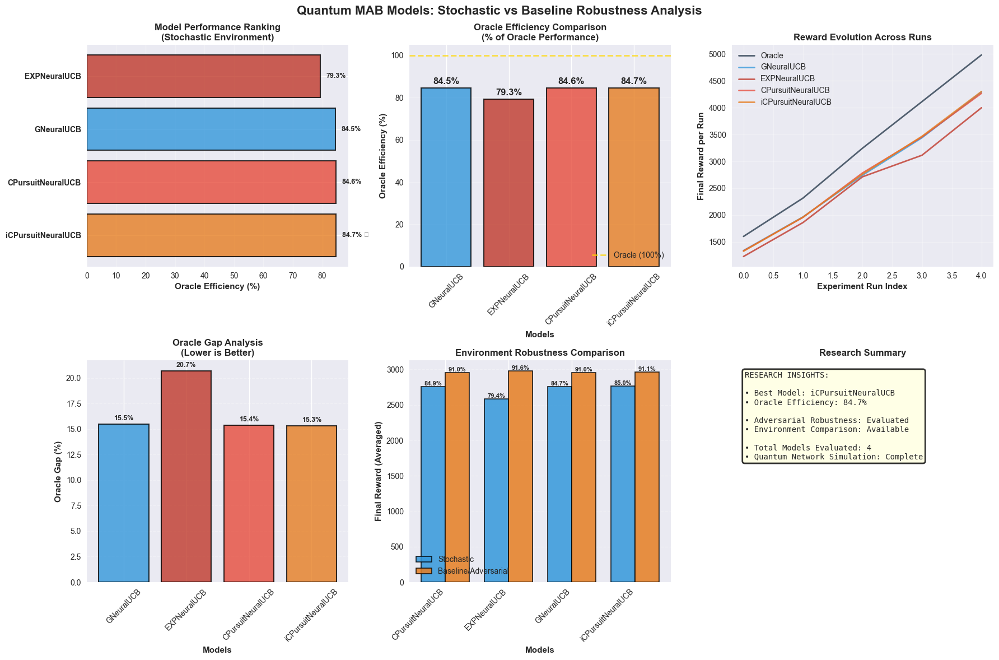


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	015.3%
	Winner Avg Efficiency: 	084.7%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	084.7% Efficiency 	(Won 2/5 experiments)
	• CPursuitNeuralUCB: 	084.6% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	084.5% Efficiency 	(Won 2/5 experiments)
	• EXPNeuralUCB   : 	079.3% Efficiency 	(Won 0/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Default_stochastic_vs_baseline_20260306_015404.png


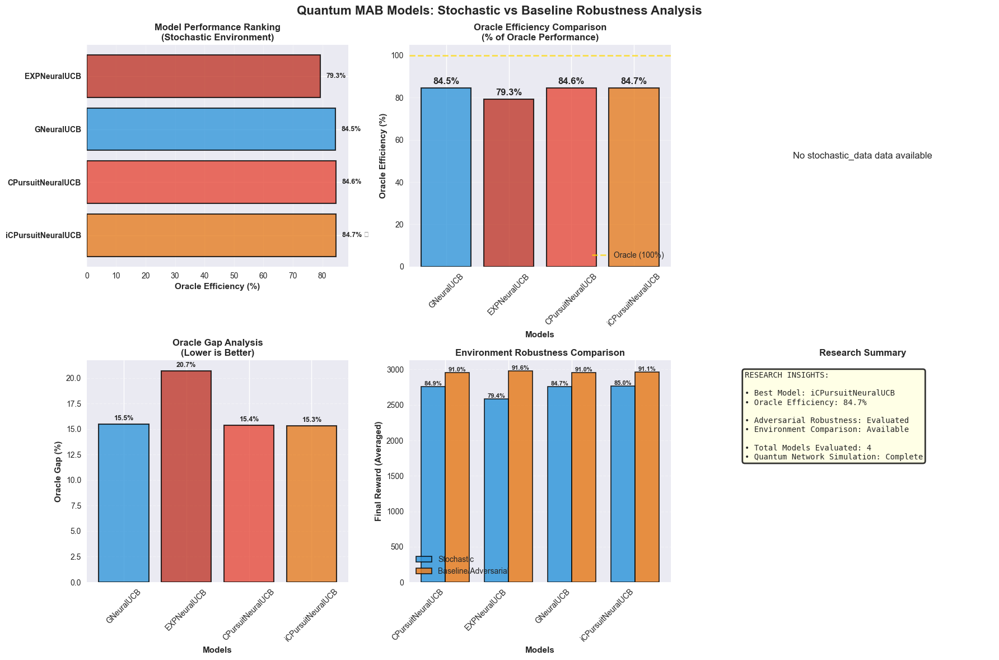


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.1%
	Winner Avg Efficiency: 	056.9%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.9% Efficiency 	(Won 5/5 experiments)
	• GNeuralUCB     : 	050.6% Efficiency 	(Won 0/5 experiments)
	• CPursuitNeuralUCB: 	050.0% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	046.0% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Default_markov_vs_baseline_20260306_015404.png


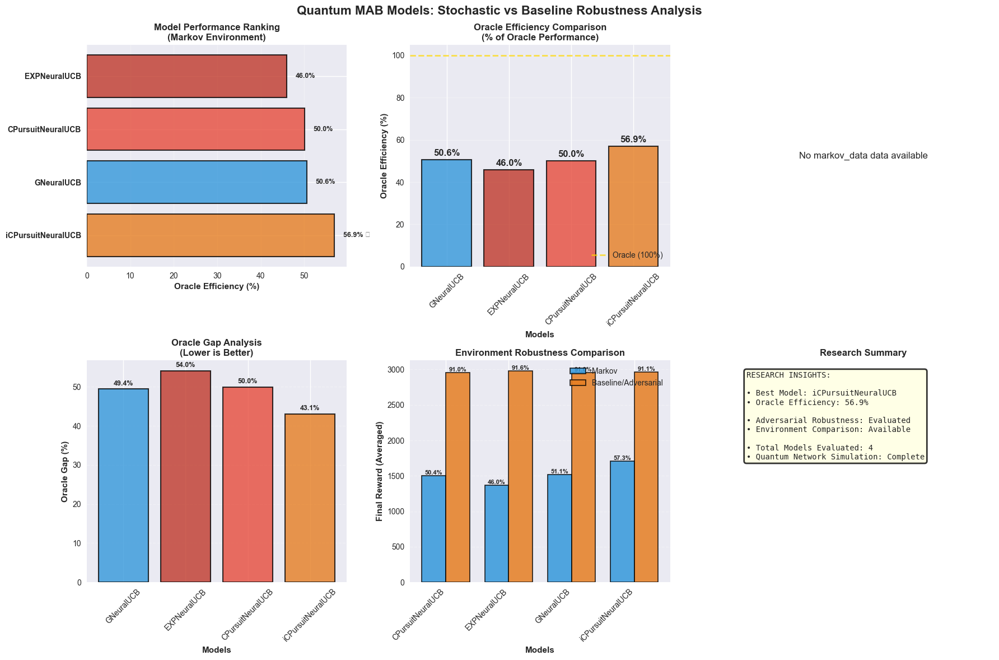


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 0/5 experiments)
	Winner Avg Gap: 	029.9%
	Winner Avg Efficiency: 	070.1%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	070.1% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	070.0% Efficiency 	(Won 3/5 experiments)
	• CPursuitNeuralUCB: 	069.8% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	068.0% Efficiency 	(Won 1/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Default_adaptive_vs_baseline_20260306_015404.png


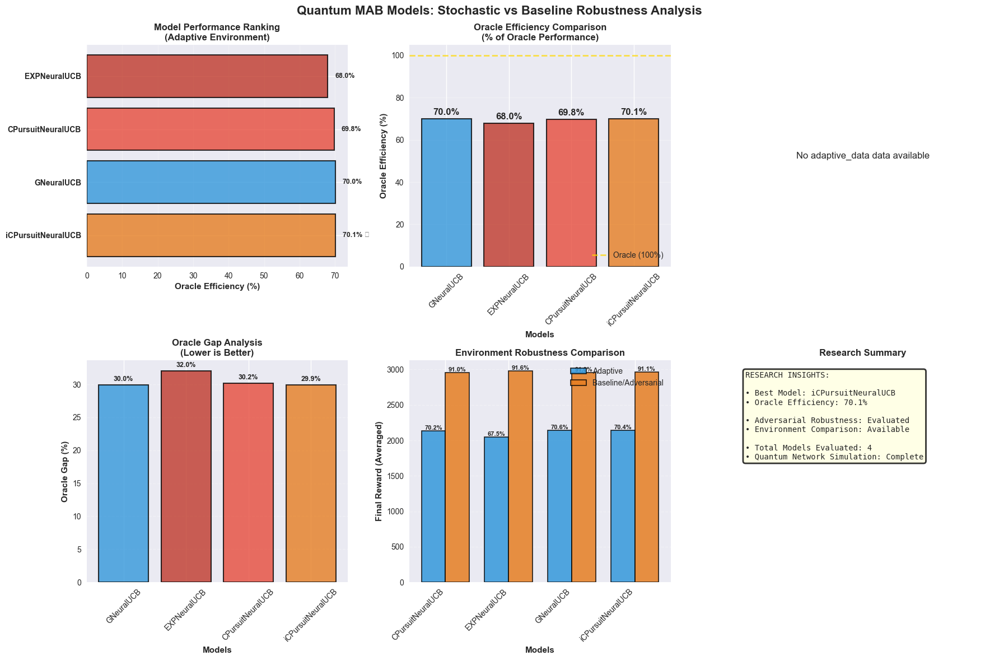


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	EXPNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	029.2%
	Winner Avg Efficiency: 	070.8%

Overall Models Performance:
	• EXPNeuralUCB   : 	070.8% Efficiency 	(Won 3/5 experiments)
	• CPursuitNeuralUCB: 	069.0% Efficiency 	(Won 0/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	068.9% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Default_onlineadaptive_vs_baseline_20260306_015404.png


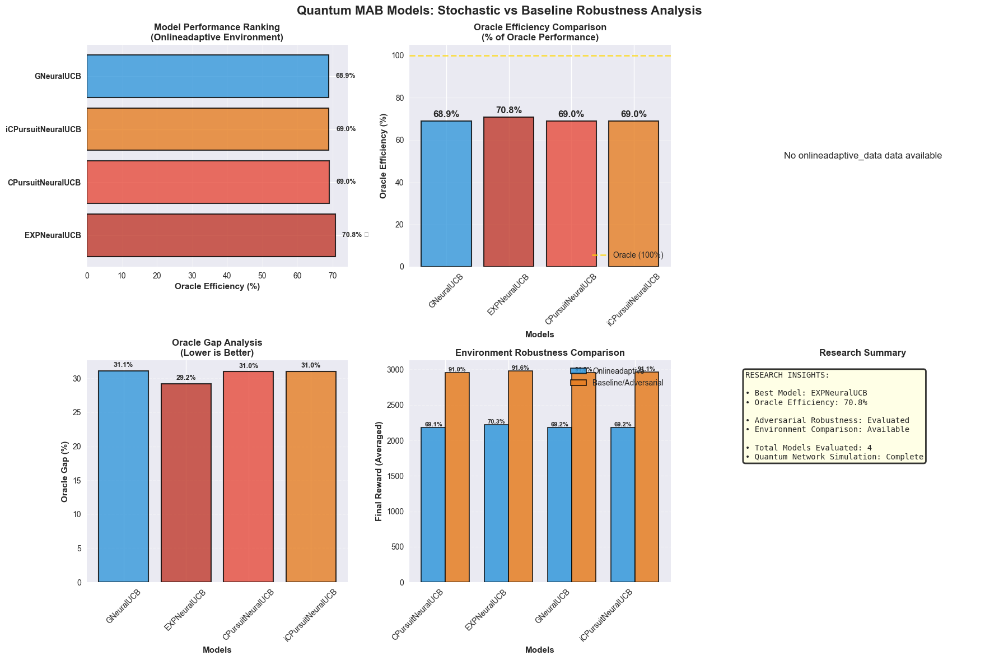


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3252.261
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2756.113
  • Oracle Efficiency: 84.5%
  • Oracle Gap: 15.5%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2583.201
  • Oracle Efficiency: 79.3%
  • Oracle Gap: 20.7%
  • Classification: MODERATE

CPursuitNeuralUCB:
  • Stochastic Performance: 2759.891
  • Oracle Efficiency: 84.6%
  • Oracle Gap: 15.4%
  • Classification: GOOD

iCPursuitNeuralUCB:
  • Stochastic Performance: 2764.322
  • Oracle Efficiency: 84.7%
  • Oracle Gap: 15.3%
  • Classification: GOOD
  ★ WINNER ★
[Logging Redirect Stopped]

🧹 Final cleanup for Default

✅ COMPLETED: Default

Default COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: Default at scale 1.5
--------------------------------------------------

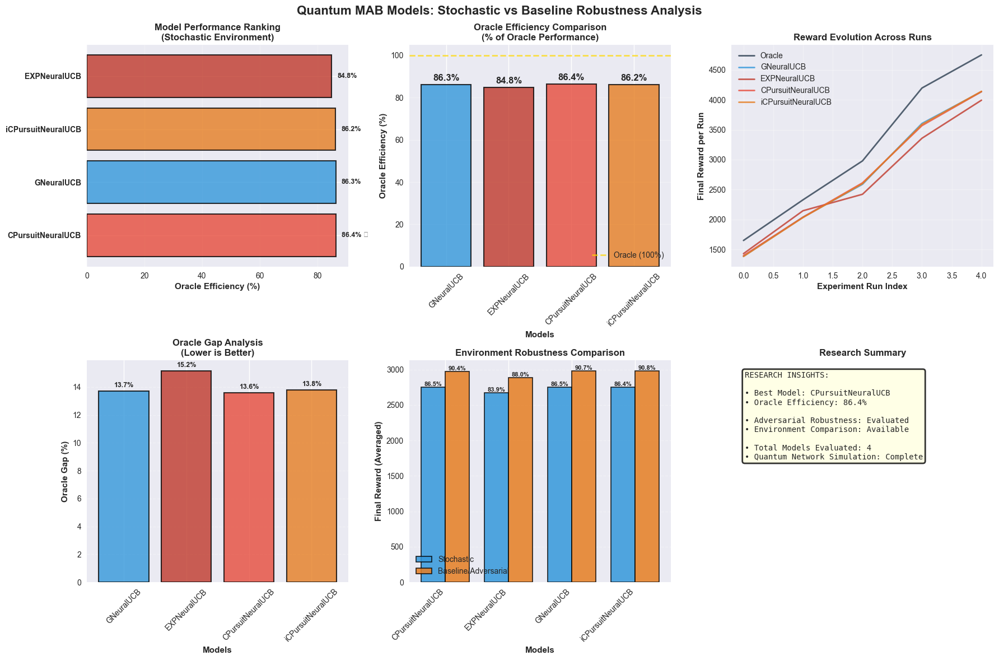


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Default_stochastic_vs_baseline_20260306_015623.png


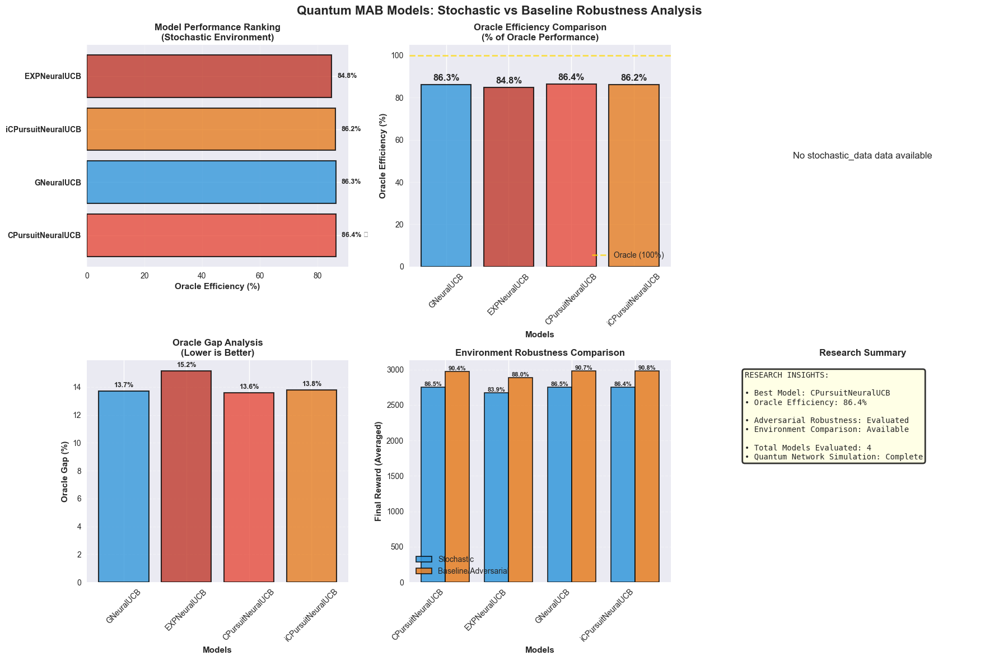


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Default_markov_vs_baseline_20260306_015623.png


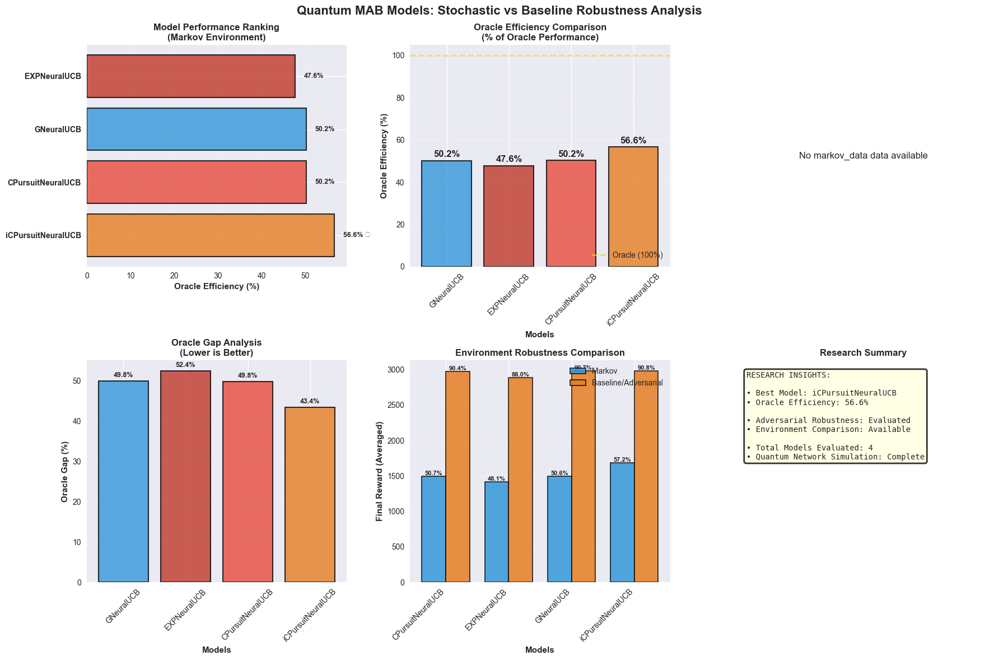


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Default_adaptive_vs_baseline_20260306_015623.png


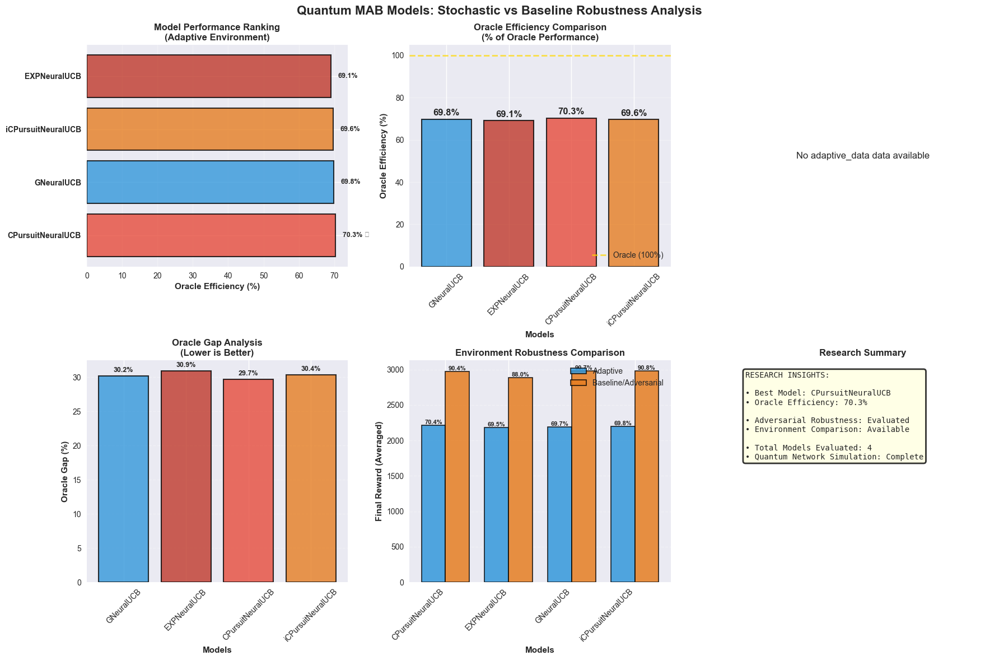


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Default_onlineadaptive_vs_baseline_20260306_015623.png


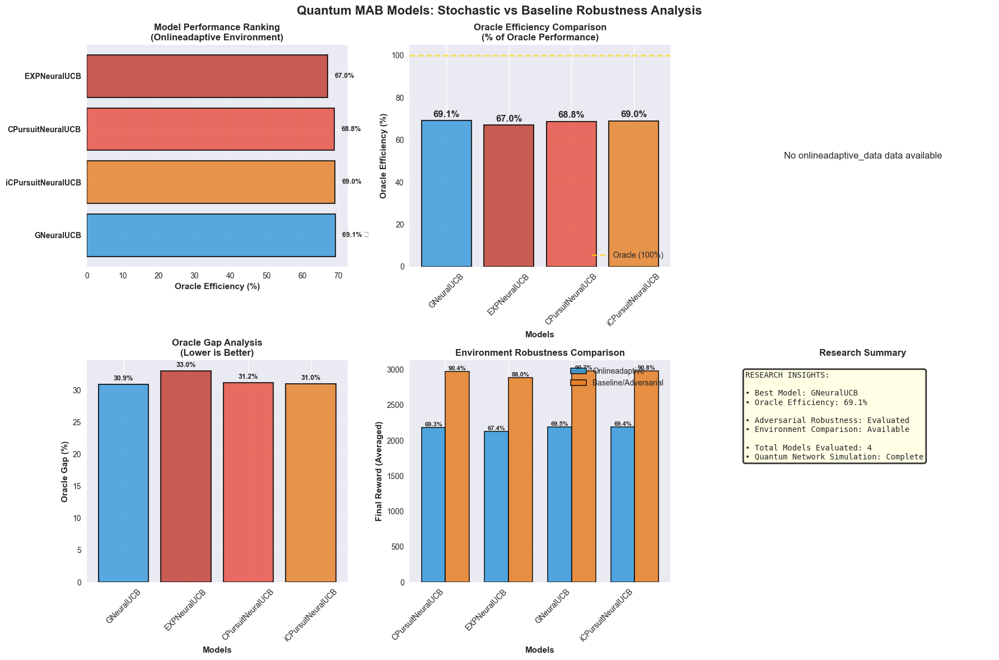


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Default

✅ COMPLETED: Default

Default COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: Default at scale 2
--------------------------------------------------------

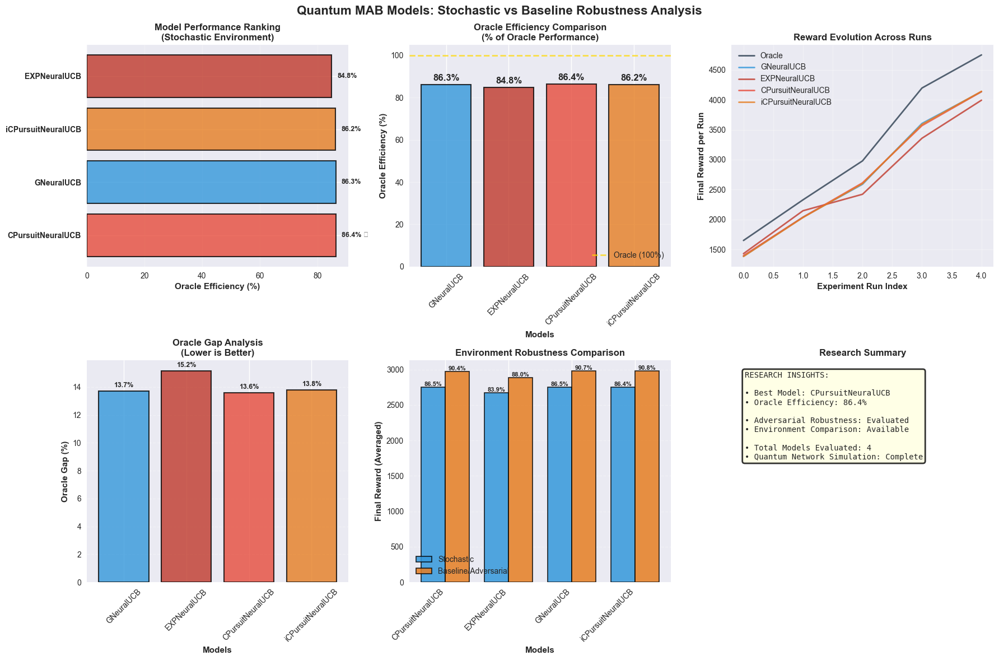


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Default_stochastic_vs_baseline_20260306_015813.png


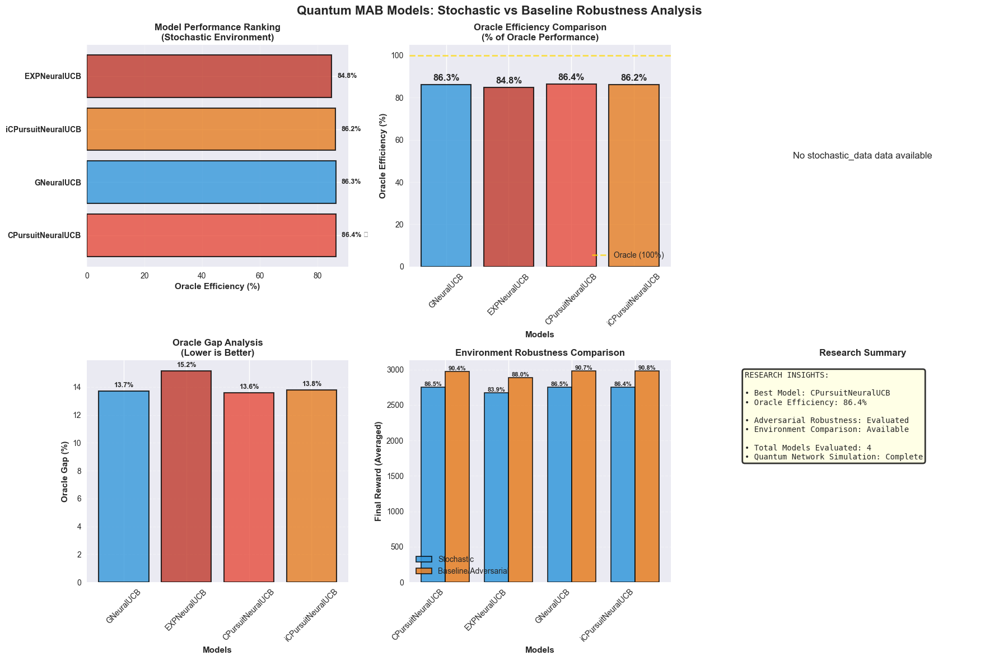


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Default_markov_vs_baseline_20260306_015813.png


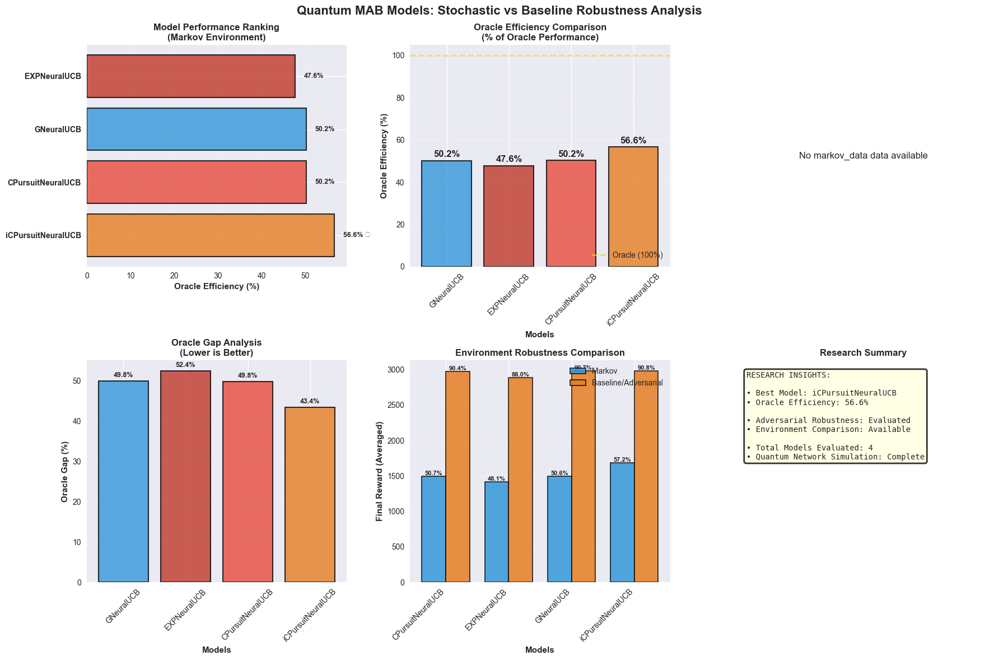


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Default_adaptive_vs_baseline_20260306_015813.png


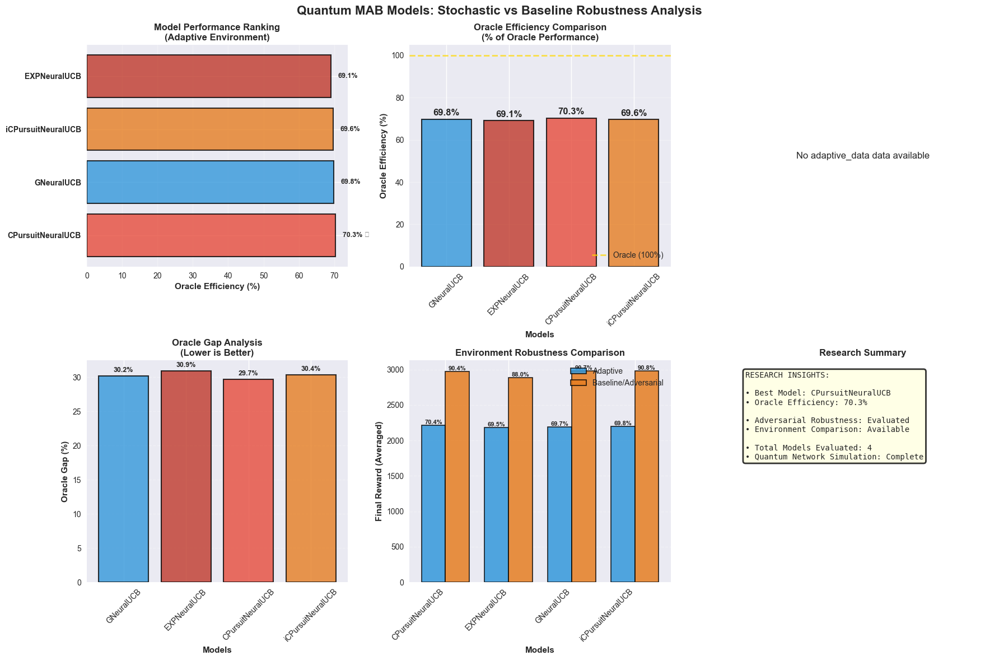


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Default_onlineadaptive_vs_baseline_20260306_015813.png


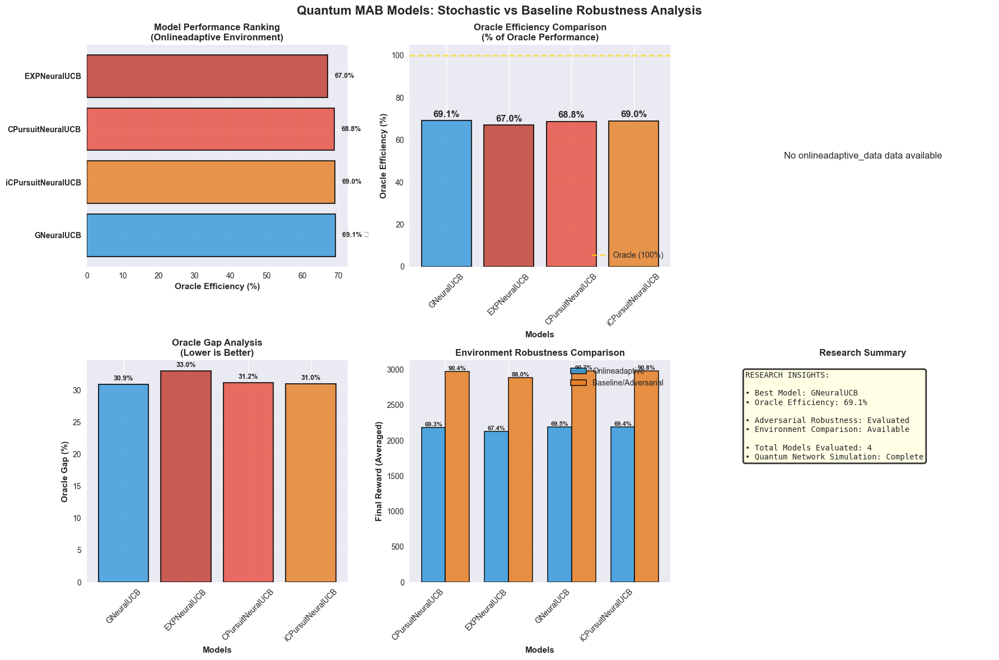


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Default

✅ COMPLETED: Default

Default COMPLETED SUCCESSFULLY

ALL ALLOCATORS COMPLETE!


In [3]:
# ============================================================
# Cell 2: Allocator + ExperimentConfiguration for Paper #2
# ============================================================
importlib.reload(qubit_allocator)
importlib.reload(experiment_config)
importlib.reload(multi_run_evaluator)

from daqr.core.quantum_physics              import *
from daqr.core.qubit_allocator              import (
                                                QubitAllocator,
                                                RandomQubitAllocator,
                                                DynamicQubitAllocator,
                                                ThompsonSamplingAllocator
                                            )

from daqr.evaluation.allocator_runner       import AllocatorRunner
from daqr.evaluation.multi_run_evaluator    import MultiRunEvaluator
from daqr.config.experiment_config          import ExperimentConfiguration



print("=" * 70, "\nPAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS\n", "=" * 70)
# ------------------------------------------------------------
# 1) Allocator selection (Paper #2: start with fixed baseline)
# ------------------------------------------------------------
# You can swap these as needed:
# allocator = RandomQubitAllocator(epsilon=0.5, seed=42)        # 50-50 mix
# allocator = RandomQubitAllocator(epsilon=0.1, seed=42)        # mostly baseline
# allocator = RandomQubitAllocator(epsilon=0.0, seed=42)        # deterministic
# allocator = DynamicQubitAllocator(seed=42)                    # dynamic UCB
# allocator = ThompsonSamplingAllocator(seed=42)                # Thompson

allocator_type =    "Default"
ALLOCATORS = ["Default"]


# ------------------------------------------------------------
# 2) Derive run parameters from FRAMEWORK_CONFIG (Cell 1)
# ------------------------------------------------------------
# current_frames      = FRAMEWORK_CONFIG['base_frames'] 
# frame_step          = FRAMEWORK_CONFIG['frame_step']
# attack_intensity    = FRAMEWORK_CONFIG['intensity']
# current_experiments = FRAMEWORK_CONFIG['exp_num']

attack_intensity    = FRAMEWORK_CONFIG['intensity']
current_frames      = 50
frame_step          = 50
current_experiments = 1
last_backup         = True
base_cap            = False
overwrite           = False

# PHYSICS_MODELS = ['paper2', 'default']  # Set to ['default', 'paper2'] to test both
ATTACK_SCENARIOS = ['stochastic']  # Start simple, expand later
PHYSICS_MODELS = ['paper2']
# PHYSICS_MODELS = ['default']
SCALES = [1, 1.5, 2]
RUNS = [5]


print("\n" + "=" * 70, "\n🎯 QUANTUM ROUTING ALLOCATOR EVALUATION\n", "=" * 70)
print(f"Total Allocators to Test:   {len(ALLOCATORS)}")
print(f"Physics Models:             {PHYSICS_MODELS}")
print(f"Allocators:                 {ALLOCATORS}")
print(f"Scales:                     {SCALES}")
print(f"Runs:                       {RUNS}")
print("=" * 70)

# Run allocator
for allocator_type in ALLOCATORS:
    print(f"\n{'='*70}")
    print(f"RUNNING: {allocator_type} on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)")
    print('='*70)

    for scale in SCALES:
        print(f"\n{'-'*70}")
        print(f"Preparing: {allocator_type} at scale {scale}")
        print(f"{'-'*70}")

        for physics_model in PHYSICS_MODELS:
            print(f"\n🔧 Generating physics parameters for model: {physics_model}") 
            try:
                # Create isolated runner instance
                custom_config = ExperimentConfiguration(
                    env_type=FRAMEWORK_CONFIG['main_env'],
                    scenarios=test_scenarios,
                    use_last_backup=last_backup,
                    models=models,
                    attack_intensity=attack_intensity,
                    scale=scale,
                    base_capacity=base_cap,
                    overwrite=overwrite
                )

                alloc_runner = AllocatorRunner(
                    allocator_type=allocator_type,
                    physics_models=[physics_model],
                    framework_config=FRAMEWORK_CONFIG,
                    scales=[scale],
                    runs=RUNS,
                    models=models,
                    test_scenarios=test_scenarios,
                    config=custom_config
                )

                # Run with Paper 12 physics
                alloc_runner.run(get_physics_params_func=get_physics_params)
                print(f"\n{allocator_type} COMPLETED SUCCESSFULLY")

            except Exception as e:
                print(f"\n{allocator_type} FAILED: {e}")
                import traceback
                traceback.print_exc()

print("\n" + "=" * 70)
print("ALL ALLOCATORS COMPLETE!")
print("=" * 70)


PAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS

🎯 QUANTUM ROUTING ALLOCATOR EVALUATION
Total Allocators to Test:   1
Physics Models:             ['paper2']
Allocators:                 ['Dynamic']
Scales:                     [1, 1.5, 2]
Runs:                       [5]

RUNNING: Dynamic on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)

----------------------------------------------------------------------
Preparing: Dynamic at scale 1
----------------------------------------------------------------------

🔧 Generating physics parameters for model: paper2

===================== GET LOCAL REGISTRY =====================
→ Skipping local cache (force=True or file missing)

===================== BUILD LOCAL REGISTRY =====================

🔍 SCANNING LOCAL FILES
Parameters: load_to_drive=False, force=False

📂 Checking DRIVE mode: /content/drive/Shareddrives/ai_quantum_computing/quantum_data_lake
   ⚠️  Path does not exist, skipping

📂 Checking LOCAL mode: /Users/pitergarci

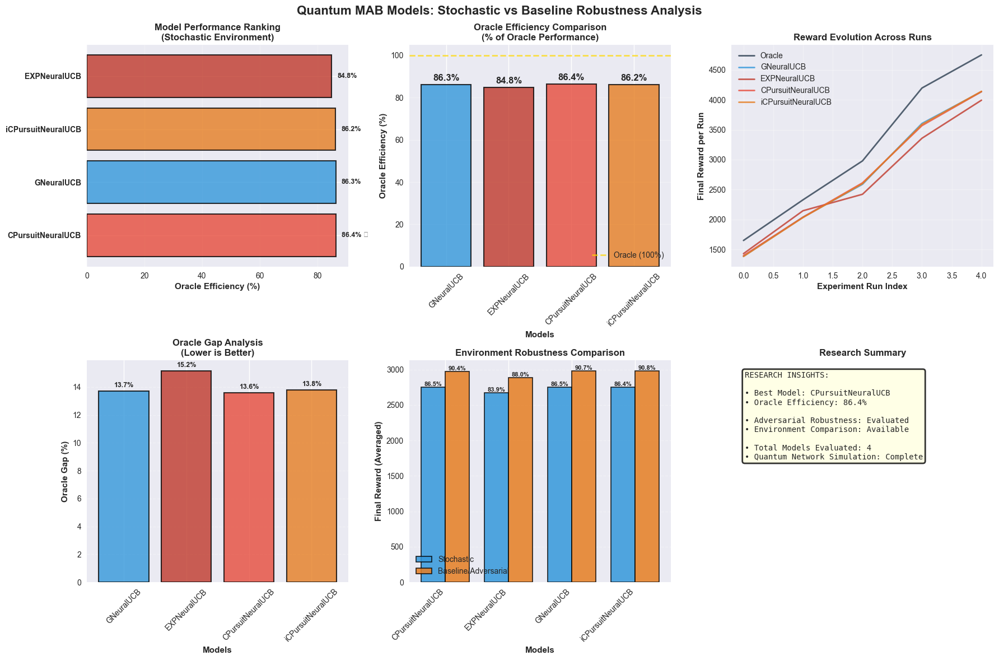


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_stochastic_vs_baseline_20260306_020345.png


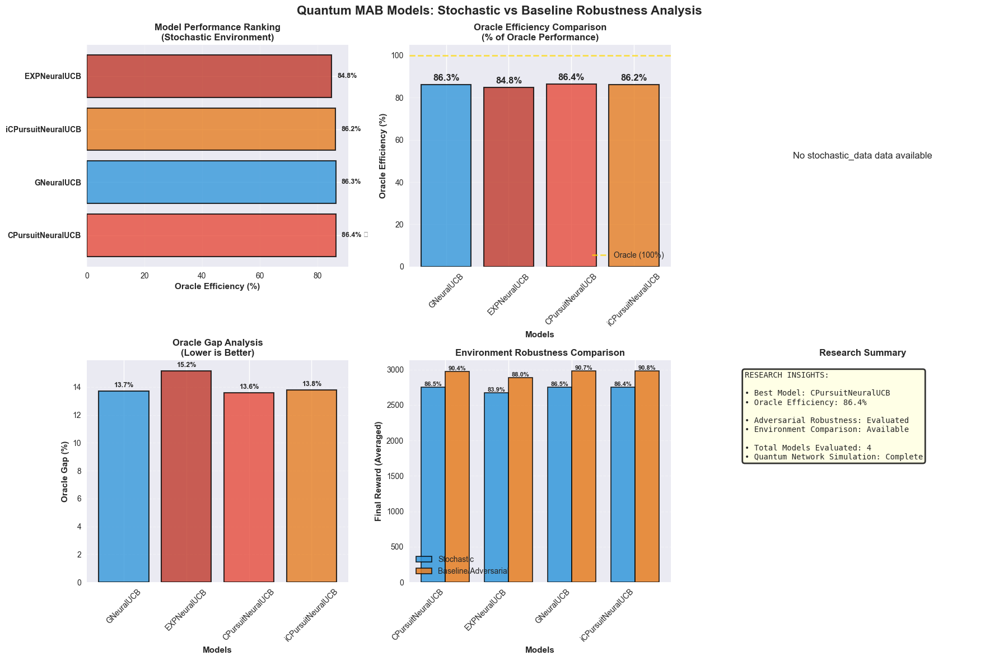


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_markov_vs_baseline_20260306_020345.png


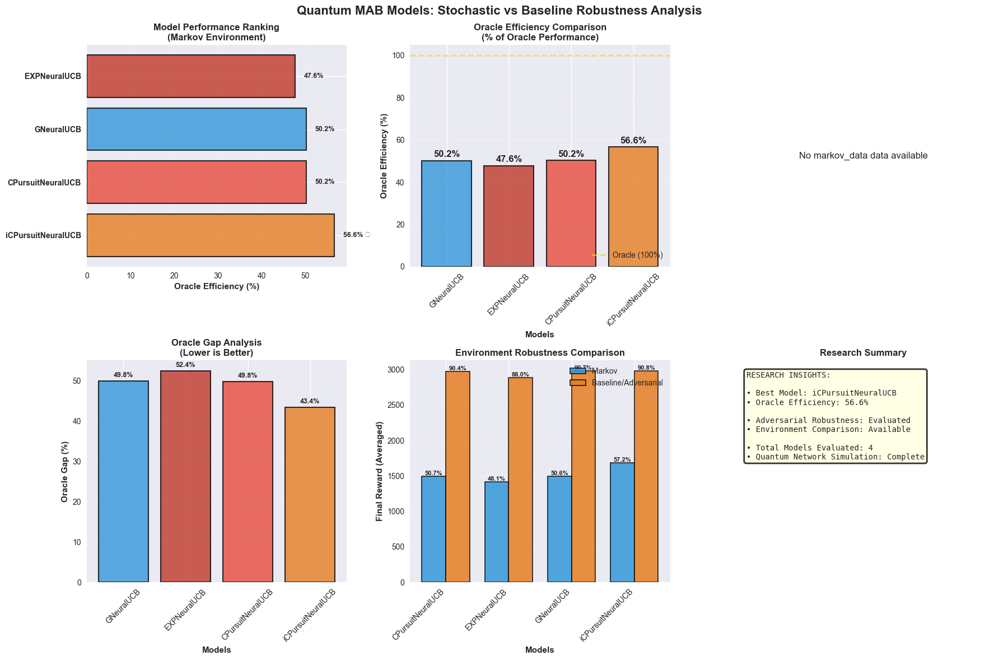


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_adaptive_vs_baseline_20260306_020345.png


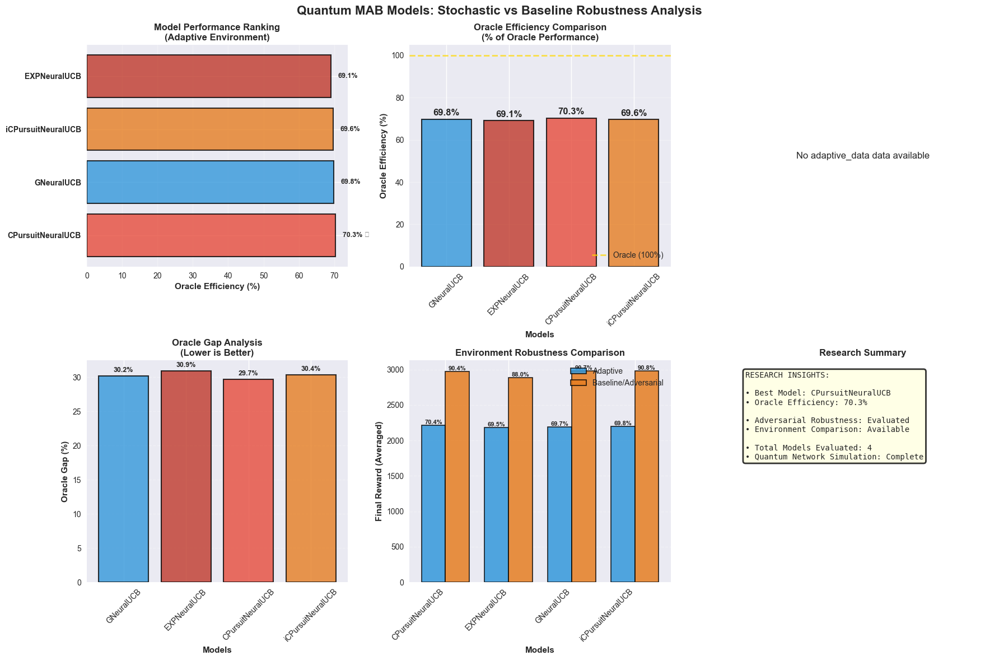


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_onlineadaptive_vs_baseline_20260306_020345.png


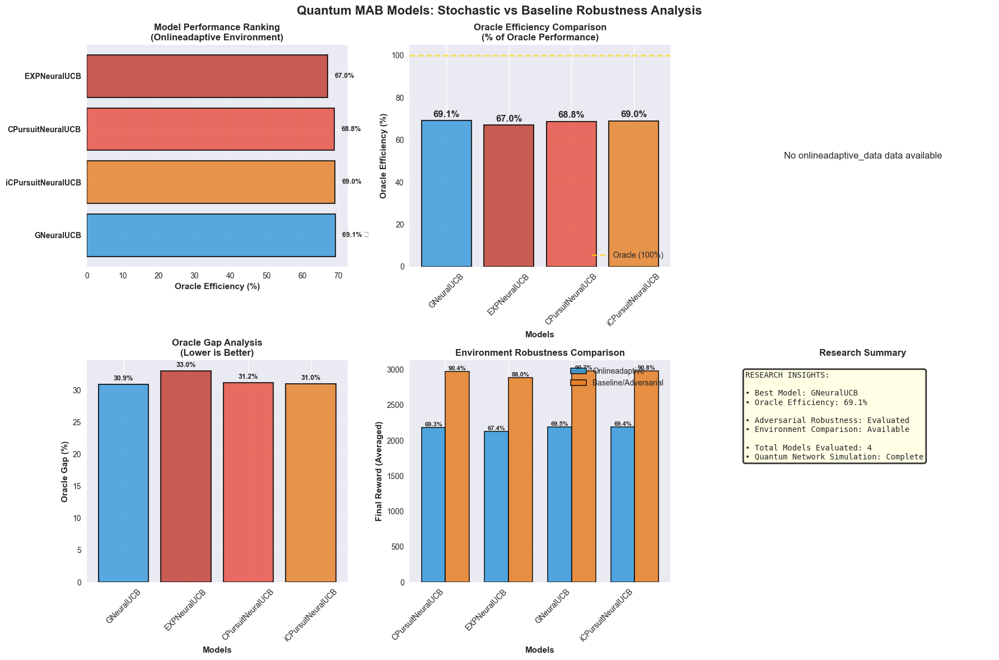


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Dynamic

✅ COMPLETED: Dynamic

Dynamic COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: Dynamic at scale 1.5
------------------------------------------------------

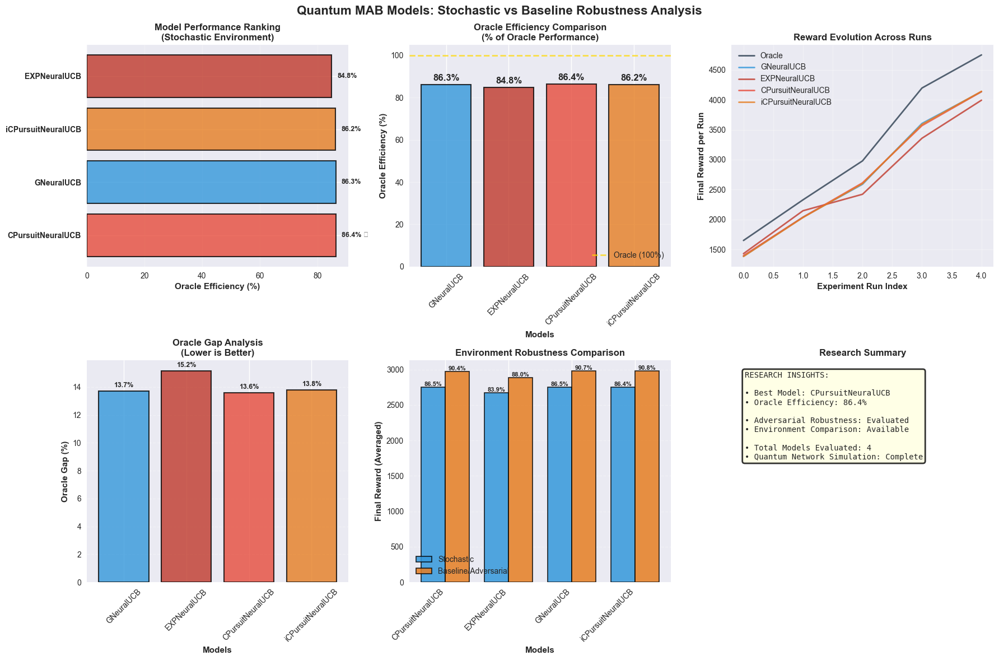


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_stochastic_vs_baseline_20260306_020927.png


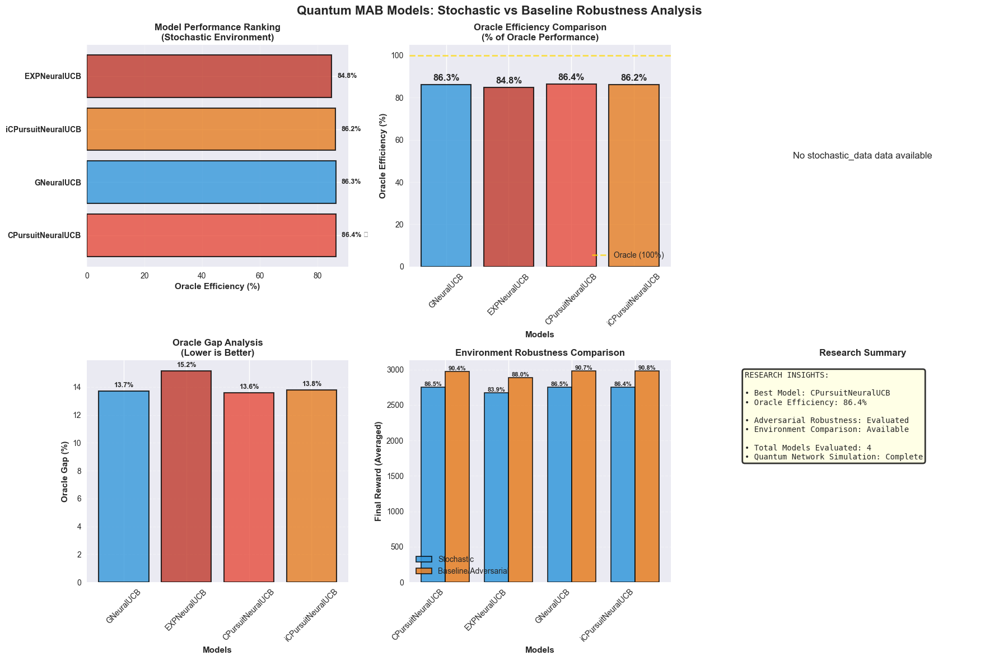


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_markov_vs_baseline_20260306_020927.png


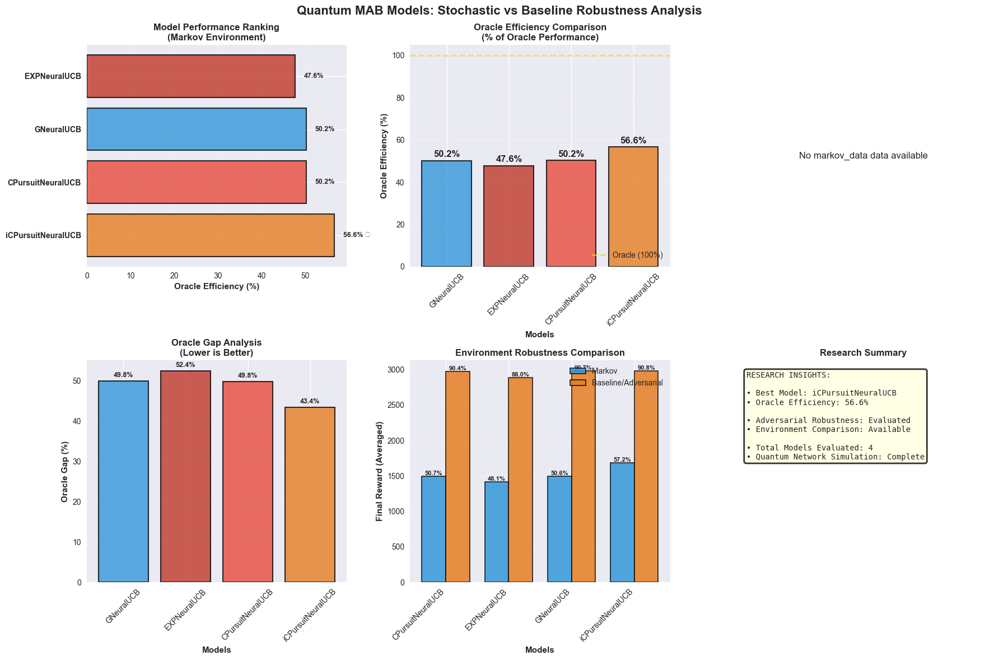


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_adaptive_vs_baseline_20260306_020927.png


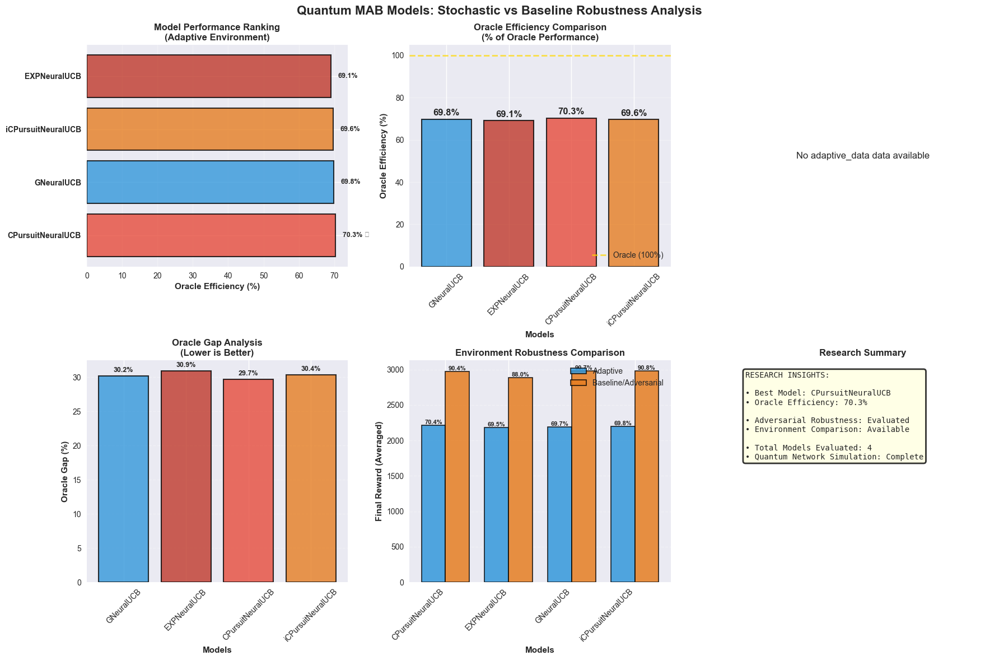


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_onlineadaptive_vs_baseline_20260306_020927.png


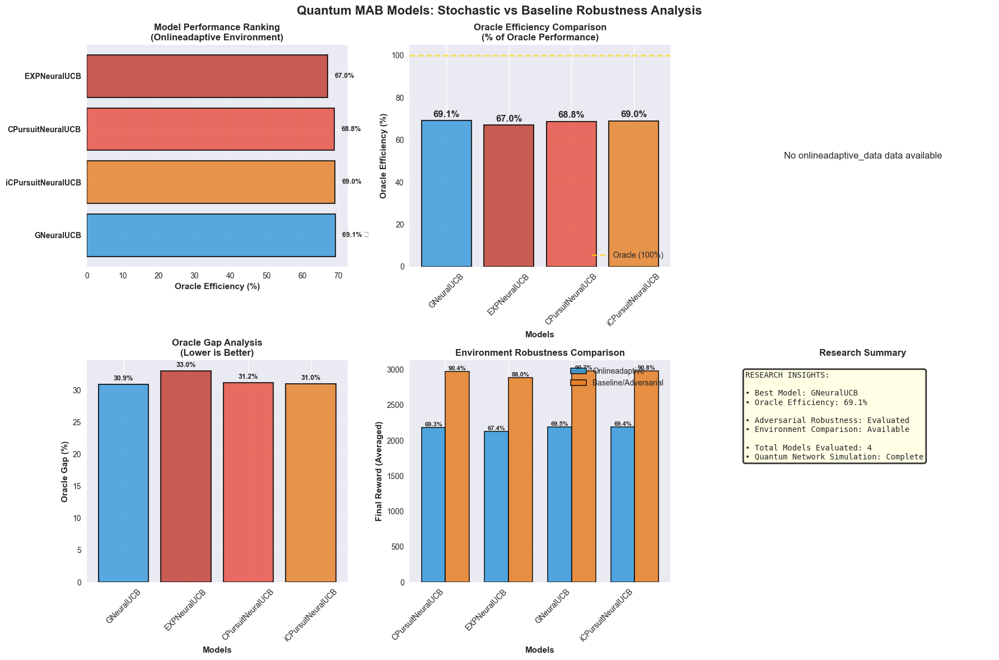


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Dynamic

✅ COMPLETED: Dynamic

Dynamic COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: Dynamic at scale 2
--------------------------------------------------------

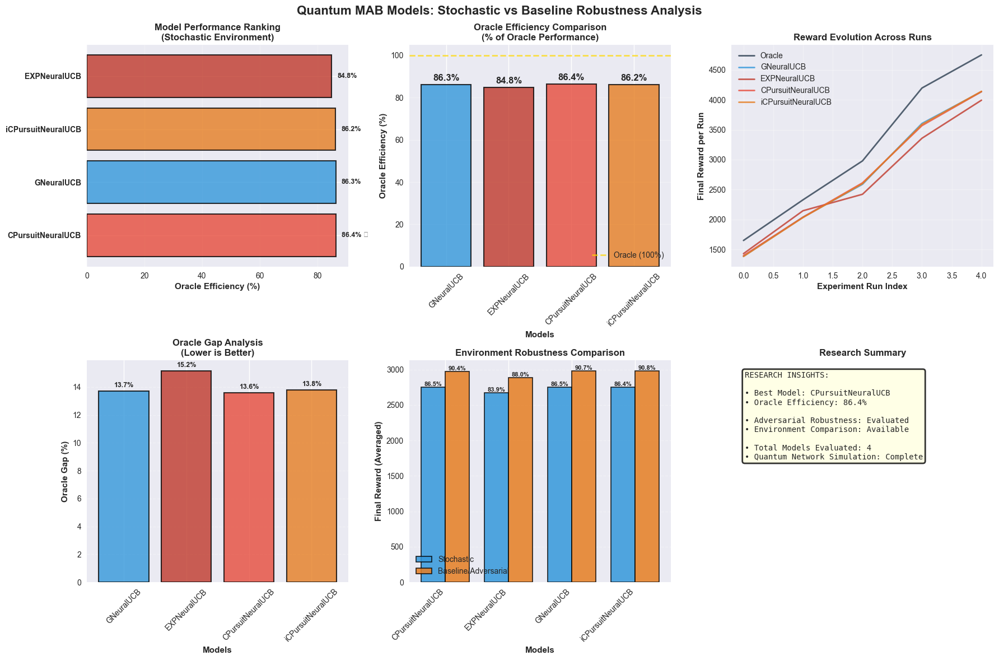


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_stochastic_vs_baseline_20260306_021504.png


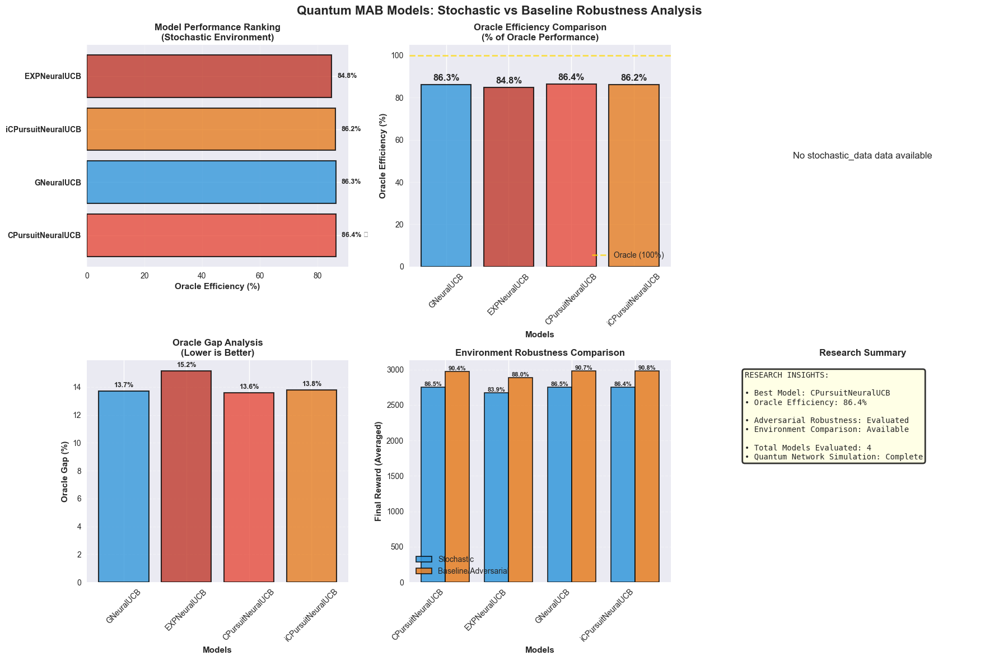


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_markov_vs_baseline_20260306_021504.png


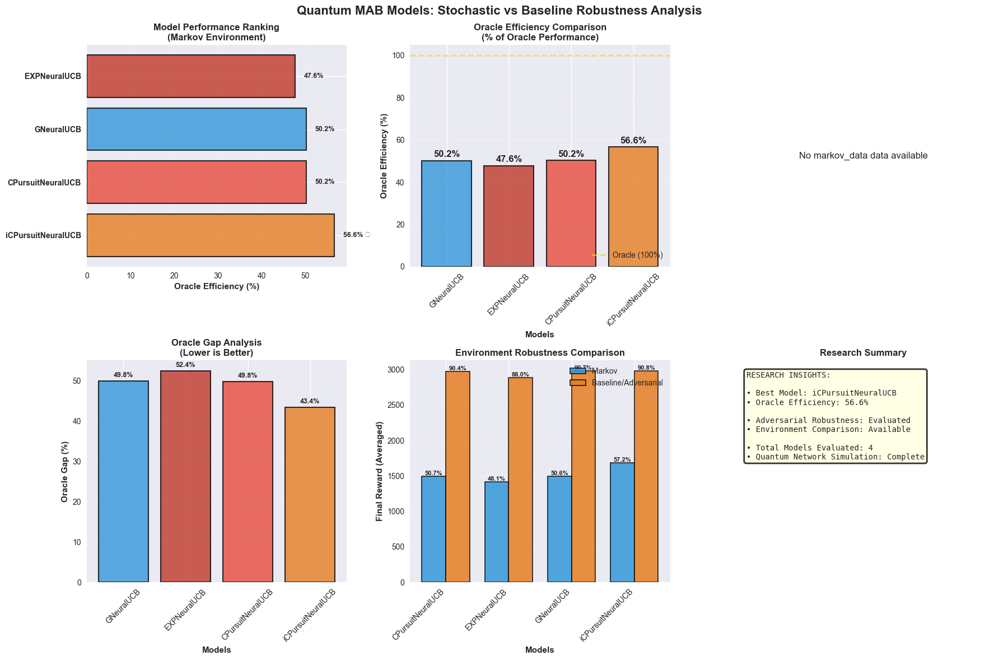


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_adaptive_vs_baseline_20260306_021504.png


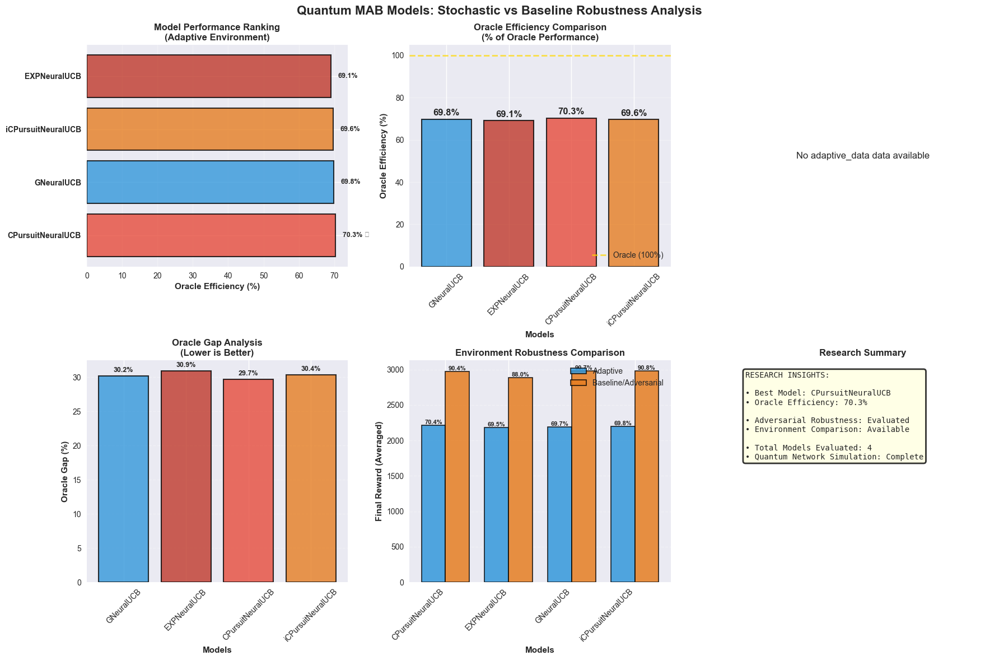


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Dynamic_onlineadaptive_vs_baseline_20260306_021504.png


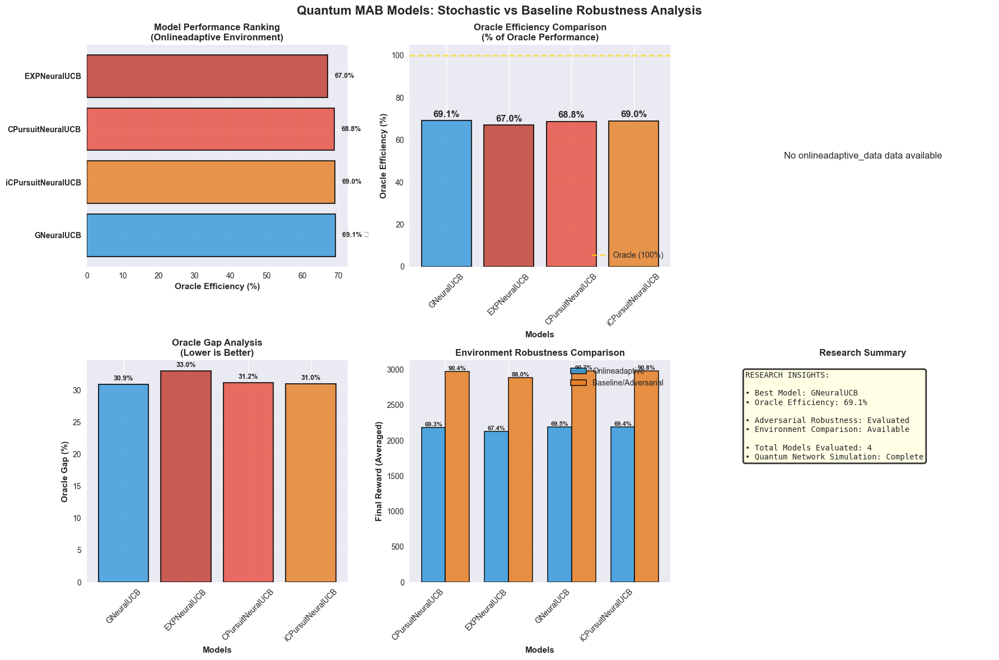


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Dynamic

✅ COMPLETED: Dynamic

Dynamic COMPLETED SUCCESSFULLY

ALL ALLOCATORS COMPLETE!


In [4]:
# ============================================================
# Cell 2: Allocator + ExperimentConfiguration for Paper #2
# ============================================================
importlib.reload(qubit_allocator)
importlib.reload(experiment_config)
importlib.reload(multi_run_evaluator)

from daqr.core.quantum_physics              import *
from daqr.core.qubit_allocator              import (
                                                QubitAllocator,
                                                RandomQubitAllocator,
                                                DynamicQubitAllocator,
                                                ThompsonSamplingAllocator
                                            )

from daqr.evaluation.allocator_runner       import AllocatorRunner
from daqr.evaluation.multi_run_evaluator    import MultiRunEvaluator
from daqr.config.experiment_config          import ExperimentConfiguration



print("=" * 70, "\nPAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS\n", "=" * 70)
# ------------------------------------------------------------
# 1) Allocator selection (Paper #2: start with fixed baseline)
# ------------------------------------------------------------
# You can swap these as needed:
# allocator = RandomQubitAllocator(epsilon=0.5, seed=42)        # 50-50 mix
# allocator = RandomQubitAllocator(epsilon=0.1, seed=42)        # mostly baseline
# allocator = RandomQubitAllocator(epsilon=0.0, seed=42)        # deterministic
# allocator = DynamicQubitAllocator(seed=42)                    # dynamic UCB
# allocator = ThompsonSamplingAllocator(seed=42)                # Thompson

allocator_type =    "Dynamic"
ALLOCATORS = ["Dynamic"]

# ------------------------------------------------------------
# 2) Derive run parameters from FRAMEWORK_CONFIG (Cell 1)
# ------------------------------------------------------------
# current_frames      = FRAMEWORK_CONFIG['base_frames'] 
# frame_step          = FRAMEWORK_CONFIG['frame_step']
# attack_intensity    = FRAMEWORK_CONFIG['intensity']
# current_experiments = FRAMEWORK_CONFIG['exp_num']

attack_intensity    = FRAMEWORK_CONFIG['intensity']
current_frames      = 50
frame_step          = 50
current_experiments = 1
last_backup         = True
base_cap            = False
overwrite           = False

# PHYSICS_MODELS = ['paper2', 'default']  # Set to ['default', 'paper2'] to test both
ATTACK_SCENARIOS = ['stochastic']  # Start simple, expand later
PHYSICS_MODELS = ['paper2']
# PHYSICS_MODELS = ['default']
SCALES = [1, 1.5, 2]
RUNS = [5]


print("\n" + "=" * 70, "\n🎯 QUANTUM ROUTING ALLOCATOR EVALUATION\n", "=" * 70)
print(f"Total Allocators to Test:   {len(ALLOCATORS)}")
print(f"Physics Models:             {PHYSICS_MODELS}")
print(f"Allocators:                 {ALLOCATORS}")
print(f"Scales:                     {SCALES}")
print(f"Runs:                       {RUNS}")
print("=" * 70)

# Run allocator
for allocator_type in ALLOCATORS:
    print(f"\n{'='*70}")
    print(f"RUNNING: {allocator_type} on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)")
    print('='*70)

    for scale in SCALES:
        print(f"\n{'-'*70}")
        print(f"Preparing: {allocator_type} at scale {scale}")
        print(f"{'-'*70}")

        for physics_model in PHYSICS_MODELS:
            print(f"\n🔧 Generating physics parameters for model: {physics_model}") 
            try:
                # Create isolated runner instance
                custom_config = ExperimentConfiguration(
                    env_type=FRAMEWORK_CONFIG['main_env'],
                    scenarios=test_scenarios,
                    use_last_backup=last_backup,
                    models=models,
                    attack_intensity=attack_intensity,
                    scale=scale,
                    base_capacity=base_cap,
                    overwrite=overwrite
                )

                alloc_runner = AllocatorRunner(
                    allocator_type=allocator_type,
                    physics_models=[physics_model],
                    framework_config=FRAMEWORK_CONFIG,
                    scales=[scale],
                    runs=RUNS,
                    models=models,
                    test_scenarios=test_scenarios,
                    config=custom_config
                )

                # Run with Paper 12 physics
                alloc_runner.run(get_physics_params_func=get_physics_params)
                print(f"\n{allocator_type} COMPLETED SUCCESSFULLY")

            except Exception as e:
                print(f"\n{allocator_type} FAILED: {e}")
                import traceback
                traceback.print_exc()

print("\n" + "=" * 70)
print("ALL ALLOCATORS COMPLETE!")
print("=" * 70)


PAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS

🎯 QUANTUM ROUTING ALLOCATOR EVALUATION
Total Allocators to Test:   1
Physics Models:             ['paper2']
Allocators:                 ['ThompsonSampling']
Scales:                     [1, 1.5, 2]
Runs:                       [5]

RUNNING: ThompsonSampling on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)

----------------------------------------------------------------------
Preparing: ThompsonSampling at scale 1
----------------------------------------------------------------------

🔧 Generating physics parameters for model: paper2

===================== GET LOCAL REGISTRY =====================
→ Skipping local cache (force=True or file missing)

===================== BUILD LOCAL REGISTRY =====================

🔍 SCANNING LOCAL FILES
Parameters: load_to_drive=False, force=False

📂 Checking DRIVE mode: /content/drive/Shareddrives/ai_quantum_computing/quantum_data_lake
   ⚠️  Path does not exist, skipping

📂 Checking LO

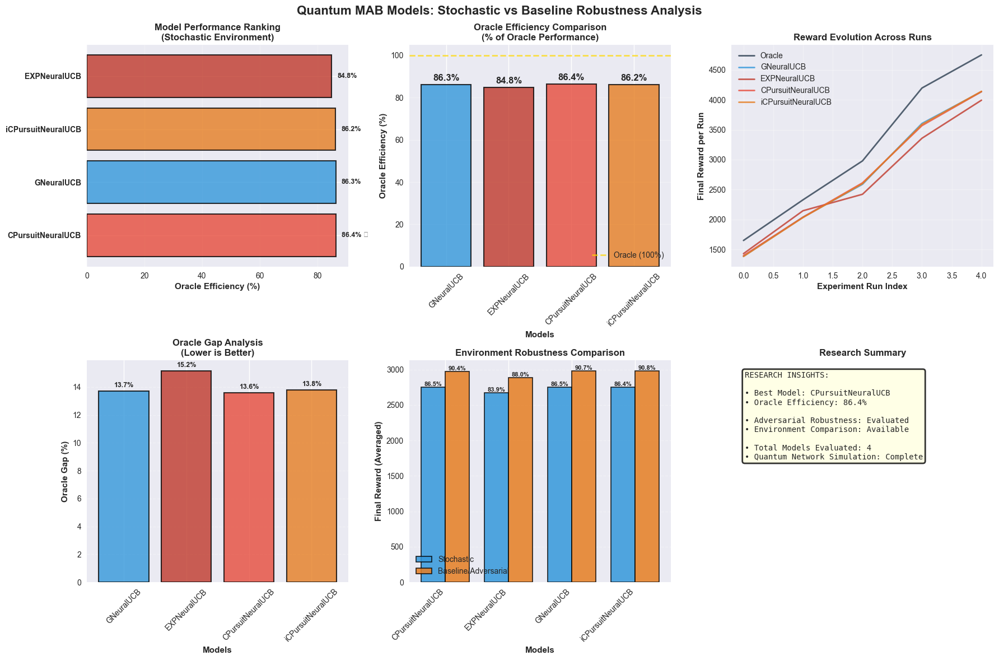


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_stochastic_vs_baseline_20260306_022116.png


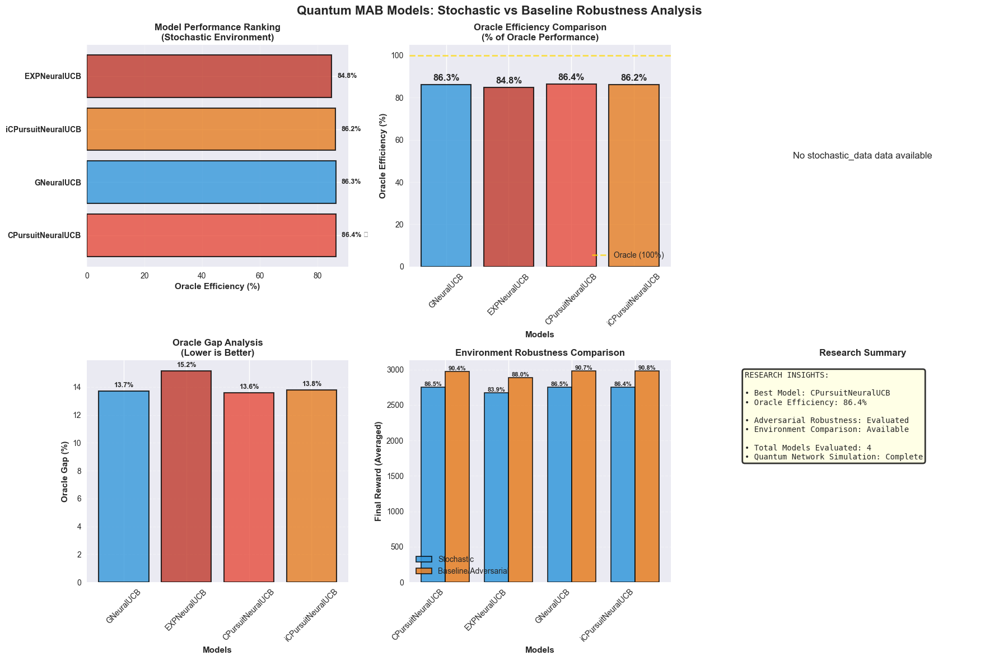


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_markov_vs_baseline_20260306_022116.png


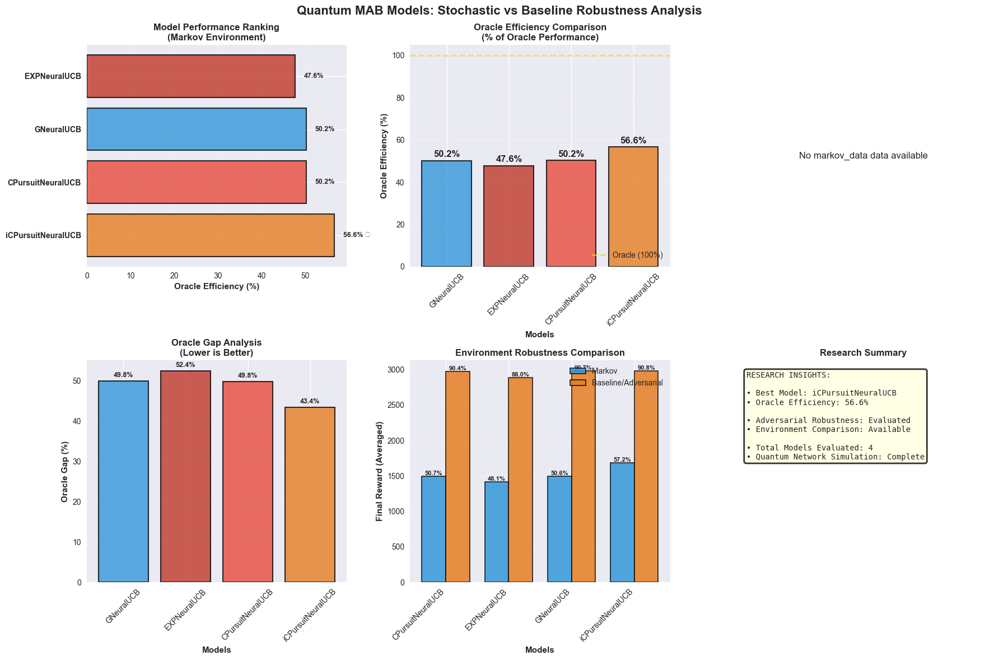


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_adaptive_vs_baseline_20260306_022116.png


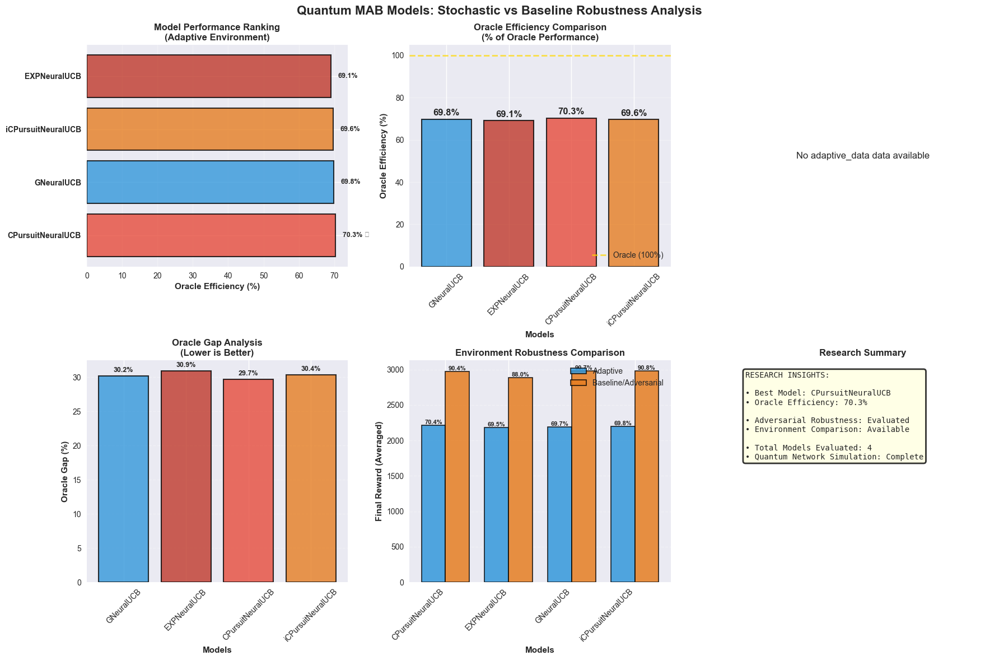


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_onlineadaptive_vs_baseline_20260306_022116.png


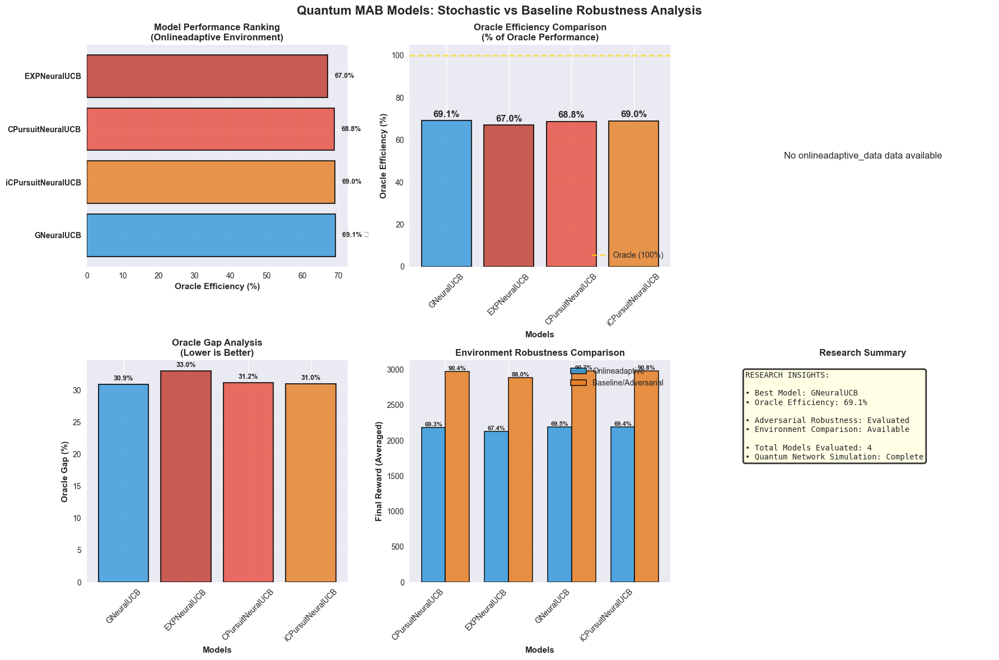


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for ThompsonSampling

✅ COMPLETED: ThompsonSampling

ThompsonSampling COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: ThompsonSampling at scale 1.5
------------------

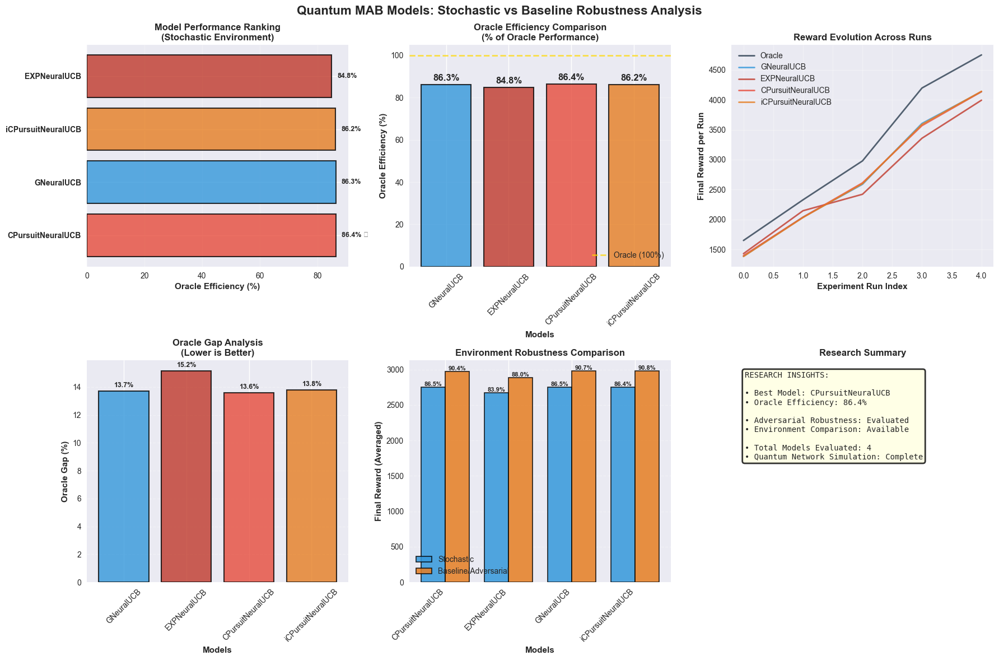


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_stochastic_vs_baseline_20260306_022721.png


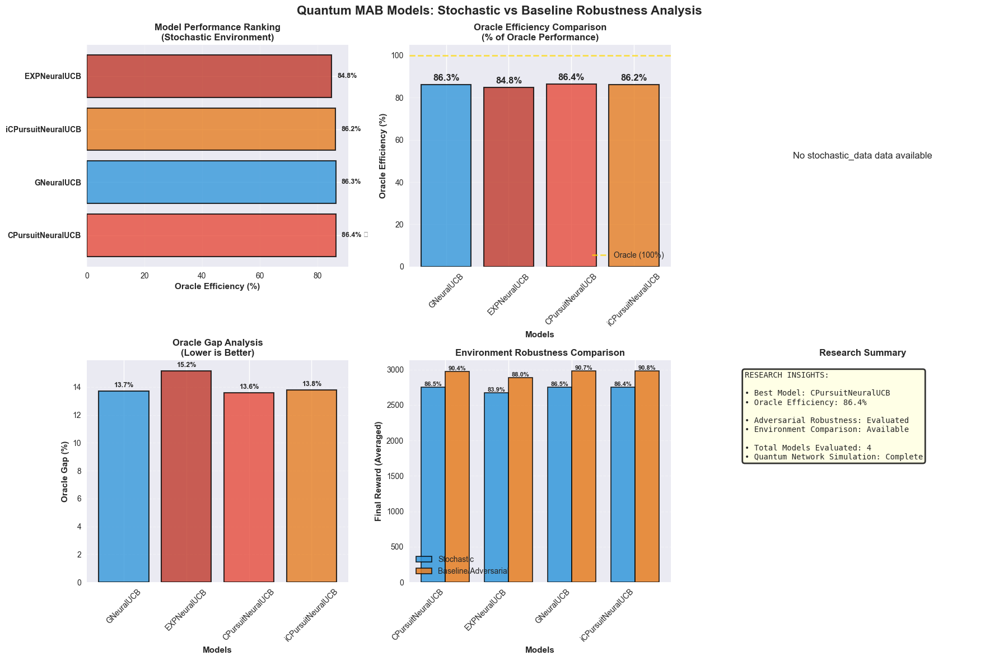


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_markov_vs_baseline_20260306_022721.png


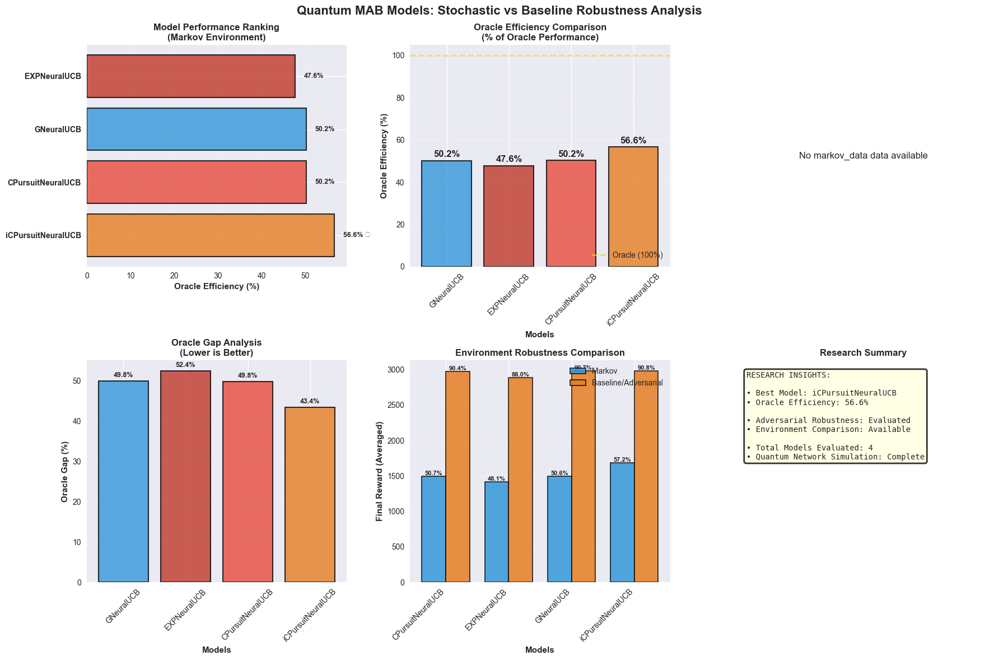


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_adaptive_vs_baseline_20260306_022721.png


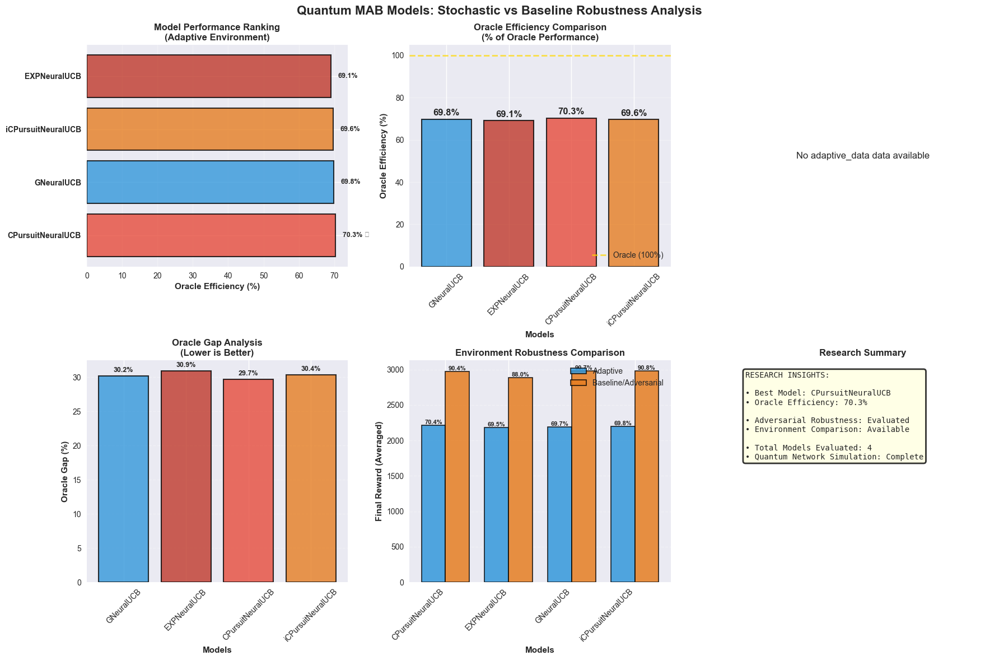


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_onlineadaptive_vs_baseline_20260306_022721.png


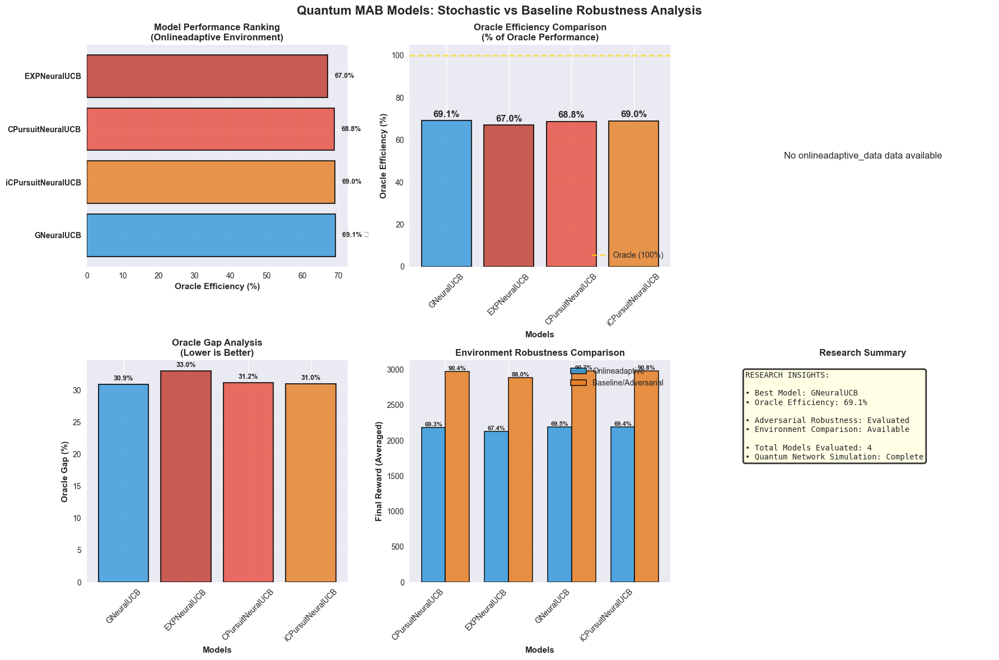


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
            [Errno 32] Broken pipe
[Logging Redirect Stopped]

🧹 Final cleanup for ThompsonSampling

✅ COMPLETED: ThompsonSampling

ThompsonSampling COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: ThompsonSampl

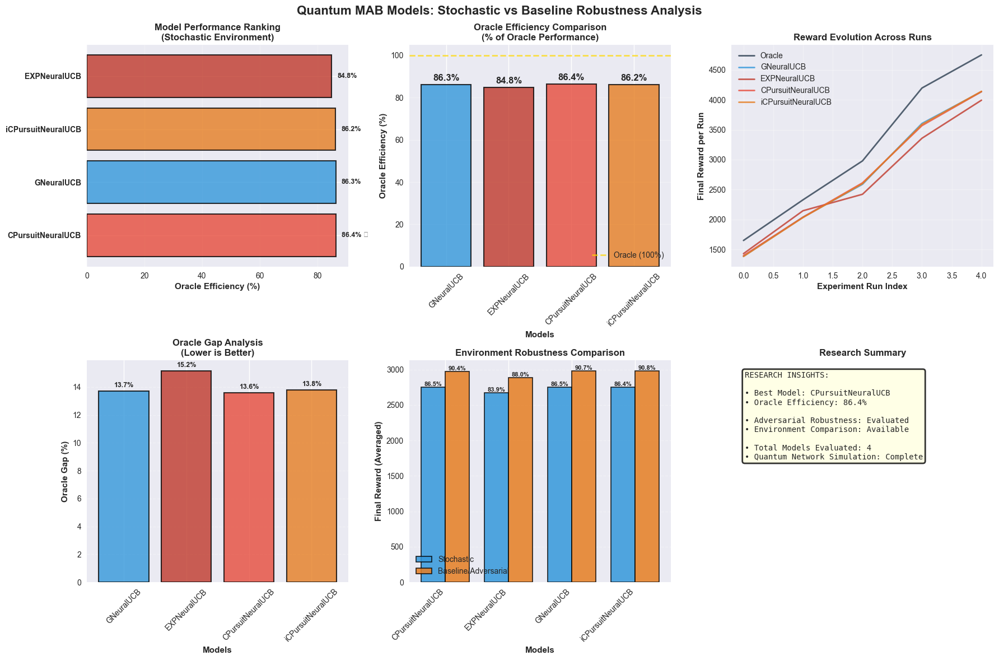


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_stochastic_vs_baseline_20260306_023318.png


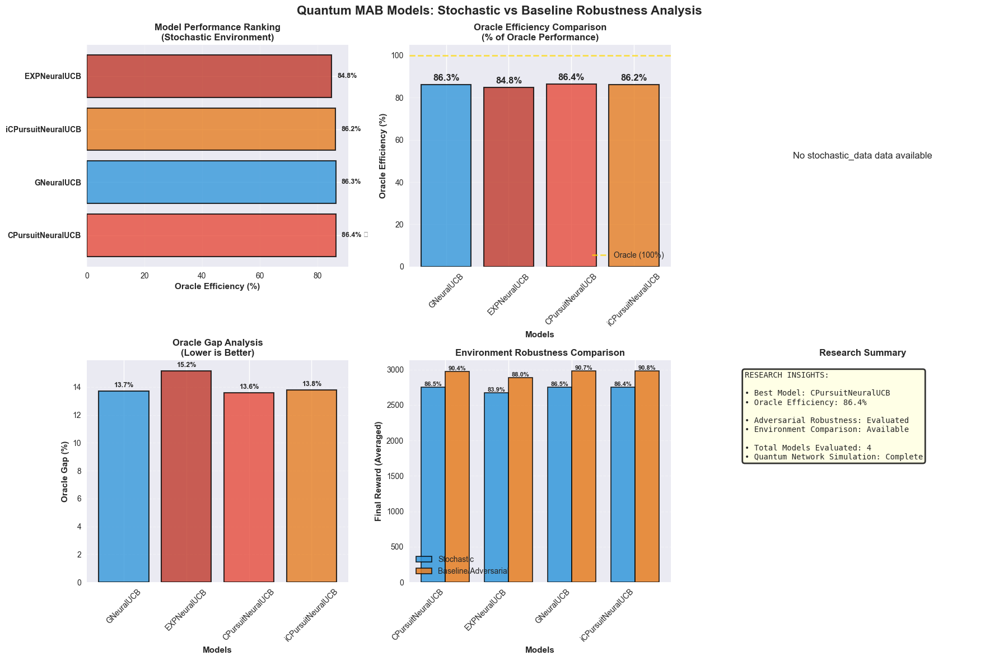


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_markov_vs_baseline_20260306_023318.png


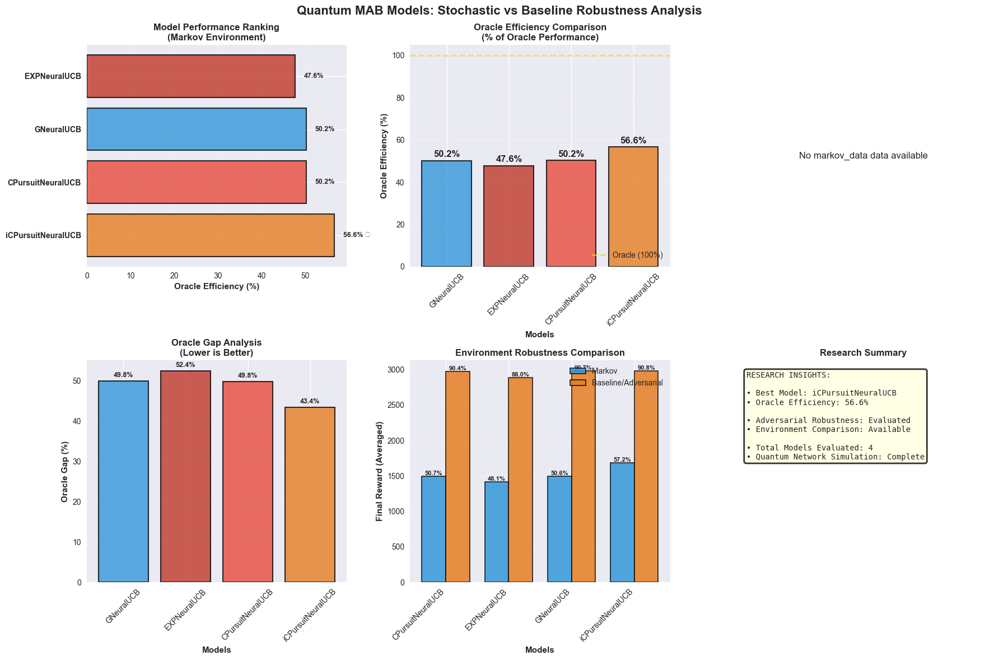


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_adaptive_vs_baseline_20260306_023318.png


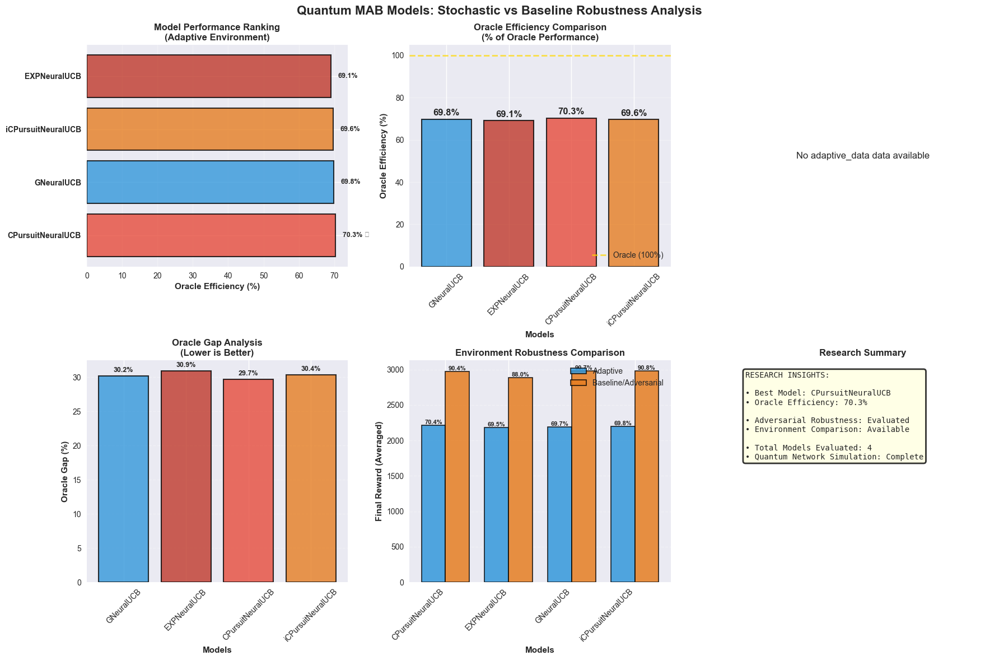


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: ThompsonSampling_onlineadaptive_vs_baseline_20260306_023318.png


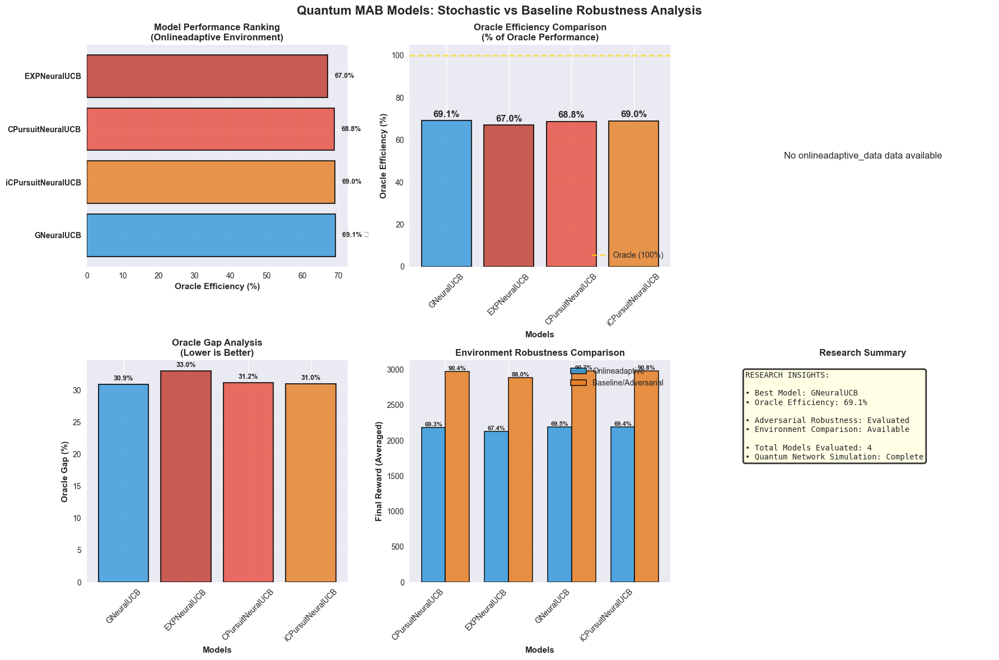


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for ThompsonSampling

✅ COMPLETED: ThompsonSampling

ThompsonSampling COMPLETED SUCCESSFULLY

ALL ALLOCATORS COMPLETE!


In [5]:
# ============================================================
# Cell 2: Allocator + ExperimentConfiguration for Paper #2
# ============================================================
importlib.reload(qubit_allocator)
importlib.reload(experiment_config)
importlib.reload(multi_run_evaluator)

from daqr.core.quantum_physics              import *
from daqr.core.qubit_allocator              import (
                                                QubitAllocator,
                                                RandomQubitAllocator,
                                                DynamicQubitAllocator,
                                                ThompsonSamplingAllocator
                                            )

from daqr.evaluation.allocator_runner       import AllocatorRunner
from daqr.evaluation.multi_run_evaluator    import MultiRunEvaluator
from daqr.config.experiment_config          import ExperimentConfiguration



print("=" * 70, "\nPAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS\n", "=" * 70)
# ------------------------------------------------------------
# 1) Allocator selection (Paper #2: start with fixed baseline)
# ------------------------------------------------------------
# You can swap these as needed:
# allocator = RandomQubitAllocator(epsilon=0.5, seed=42)        # 50-50 mix
# allocator = RandomQubitAllocator(epsilon=0.1, seed=42)        # mostly baseline
# allocator = RandomQubitAllocator(epsilon=0.0, seed=42)        # deterministic
# allocator = DynamicQubitAllocator(seed=42)                    # dynamic UCB
# allocator = ThompsonSamplingAllocator(seed=42)                # Thompson

allocator_type =    "ThompsonSampling"
ALLOCATORS = ["ThompsonSampling"]

# ------------------------------------------------------------
# 2) Derive run parameters from FRAMEWORK_CONFIG (Cell 1)
# ------------------------------------------------------------
# current_frames      = FRAMEWORK_CONFIG['base_frames'] 
# frame_step          = FRAMEWORK_CONFIG['frame_step']
# attack_intensity    = FRAMEWORK_CONFIG['intensity']
# current_experiments = FRAMEWORK_CONFIG['exp_num']

attack_intensity    = FRAMEWORK_CONFIG['intensity']
current_frames      = 50
frame_step          = 50
current_experiments = 1
last_backup         = True
base_cap            = False
overwrite           = False

# PHYSICS_MODELS = ['paper2', 'default']  # Set to ['default', 'paper2'] to test both
ATTACK_SCENARIOS = ['stochastic']  # Start simple, expand later
PHYSICS_MODELS = ['paper2']
# PHYSICS_MODELS = ['default']
SCALES = [1, 1.5, 2]
RUNS = [5]


print("\n" + "=" * 70, "\n🎯 QUANTUM ROUTING ALLOCATOR EVALUATION\n", "=" * 70)
print(f"Total Allocators to Test:   {len(ALLOCATORS)}")
print(f"Physics Models:             {PHYSICS_MODELS}")
print(f"Allocators:                 {ALLOCATORS}")
print(f"Scales:                     {SCALES}")
print(f"Runs:                       {RUNS}")
print("=" * 70)

# Run allocator
for allocator_type in ALLOCATORS:
    print(f"\n{'='*70}")
    print(f"RUNNING: {allocator_type} on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)")
    print('='*70)

    for scale in SCALES:
        print(f"\n{'-'*70}")
        print(f"Preparing: {allocator_type} at scale {scale}")
        print(f"{'-'*70}")

        for physics_model in PHYSICS_MODELS:
            print(f"\n🔧 Generating physics parameters for model: {physics_model}") 
            try:
                # Create isolated runner instance
                custom_config = ExperimentConfiguration(
                    env_type=FRAMEWORK_CONFIG['main_env'],
                    scenarios=test_scenarios,
                    use_last_backup=last_backup,
                    models=models,
                    attack_intensity=attack_intensity,
                    scale=scale,
                    base_capacity=base_cap,
                    overwrite=overwrite
                )

                alloc_runner = AllocatorRunner(
                    allocator_type=allocator_type,
                    physics_models=[physics_model],
                    framework_config=FRAMEWORK_CONFIG,
                    scales=[scale],
                    runs=RUNS,
                    models=models,
                    test_scenarios=test_scenarios,
                    config=custom_config
                )

                # Run with Paper 12 physics
                alloc_runner.run(get_physics_params_func=get_physics_params)
                print(f"\n{allocator_type} COMPLETED SUCCESSFULLY")

            except Exception as e:
                print(f"\n{allocator_type} FAILED: {e}")
                import traceback
                traceback.print_exc()

print("\n" + "=" * 70)
print("ALL ALLOCATORS COMPLETE!")
print("=" * 70)


PAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS

🎯 QUANTUM ROUTING ALLOCATOR EVALUATION
Total Allocators to Test:   1
Physics Models:             ['paper2']
Allocators:                 ['Random']
Scales:                     [1, 1.5, 2]
Runs:                       [5]

RUNNING: Random on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)

----------------------------------------------------------------------
Preparing: Random at scale 1
----------------------------------------------------------------------

🔧 Generating physics parameters for model: paper2

===================== GET LOCAL REGISTRY =====================
→ Skipping local cache (force=True or file missing)

===================== BUILD LOCAL REGISTRY =====================

🔍 SCANNING LOCAL FILES
Parameters: load_to_drive=False, force=False

📂 Checking DRIVE mode: /content/drive/Shareddrives/ai_quantum_computing/quantum_data_lake
   ⚠️  Path does not exist, skipping

📂 Checking LOCAL mode: /Users/pitergarcia/D

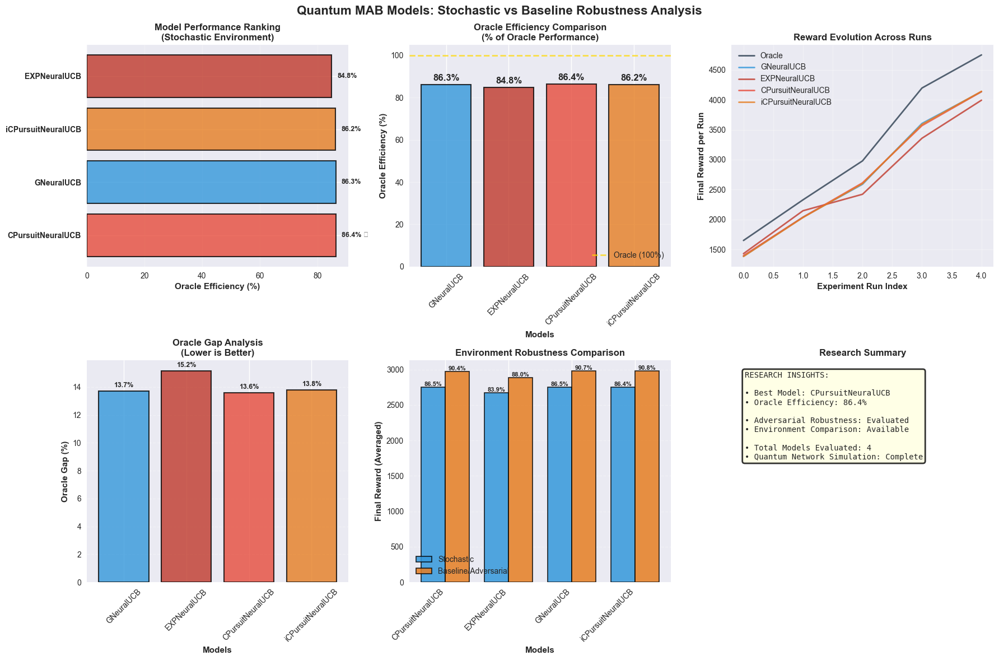


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Random_stochastic_vs_baseline_20260306_023915.png


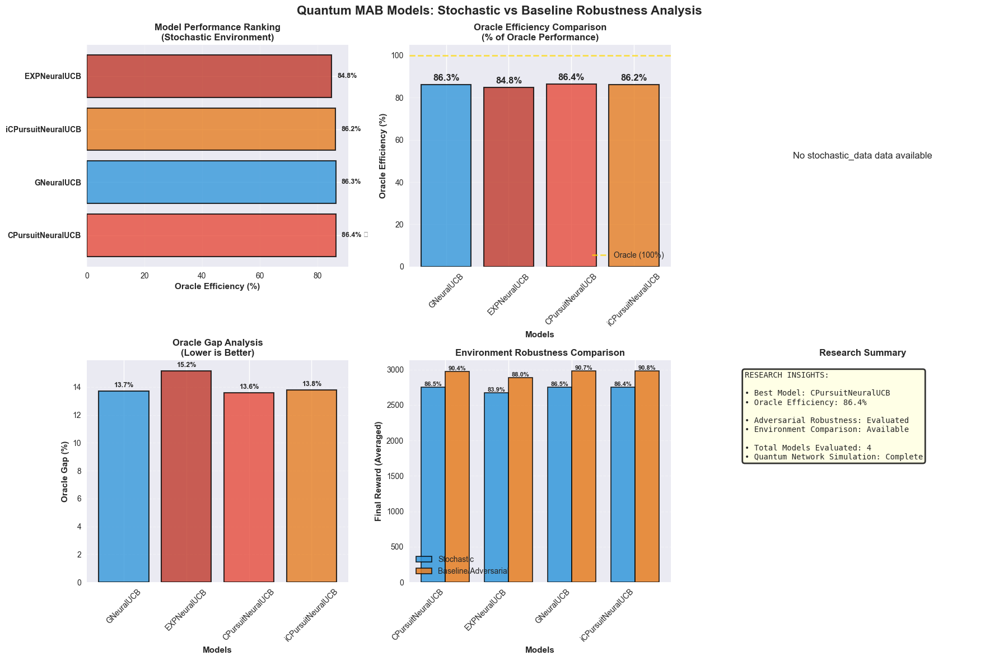


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Random_markov_vs_baseline_20260306_023915.png


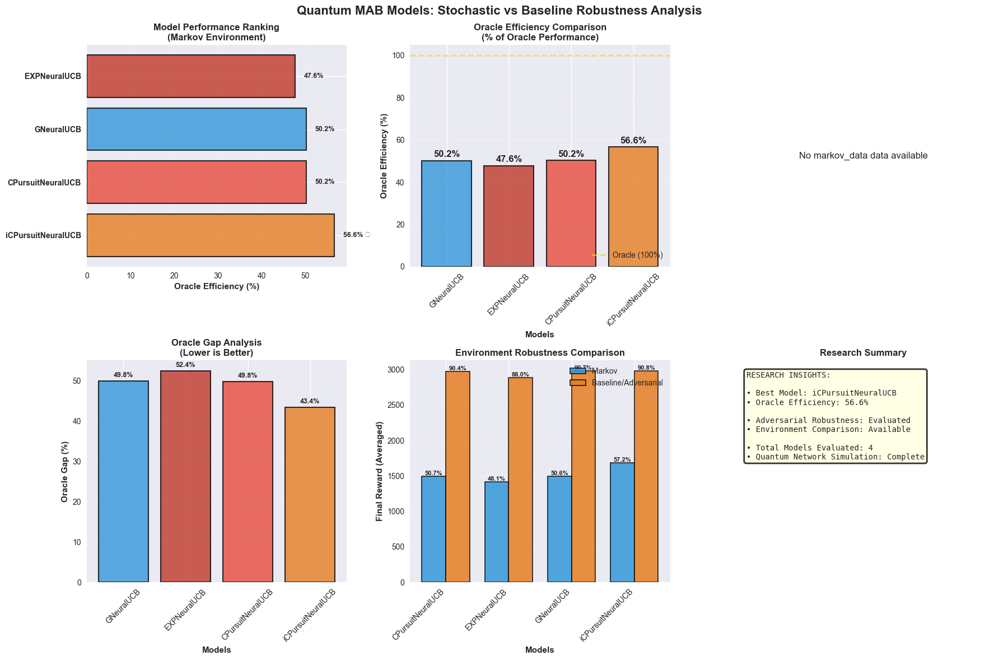


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Random_adaptive_vs_baseline_20260306_023915.png


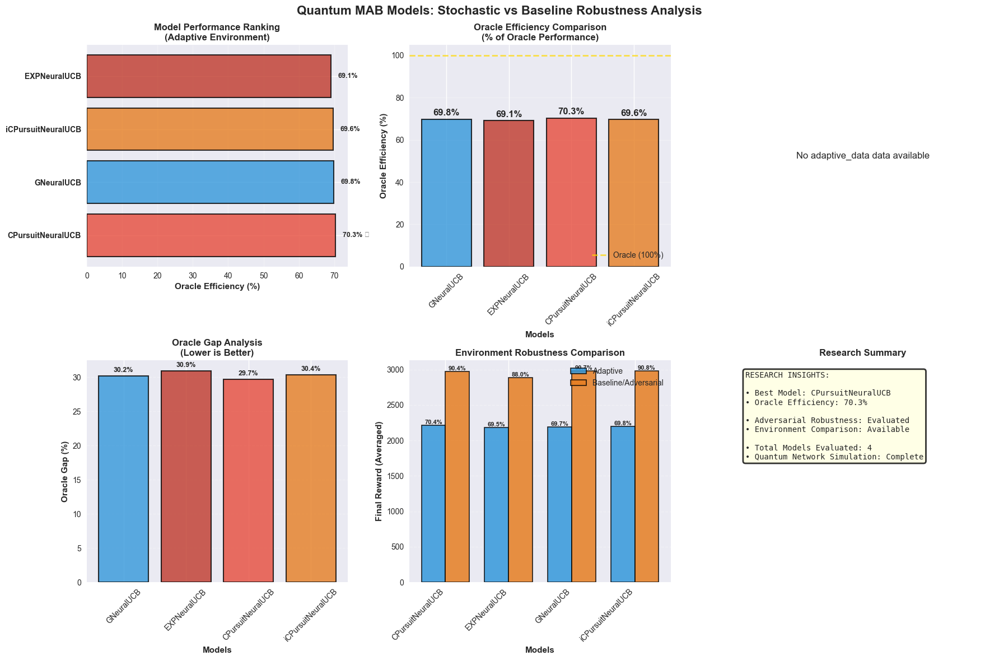


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Random_onlineadaptive_vs_baseline_20260306_023915.png


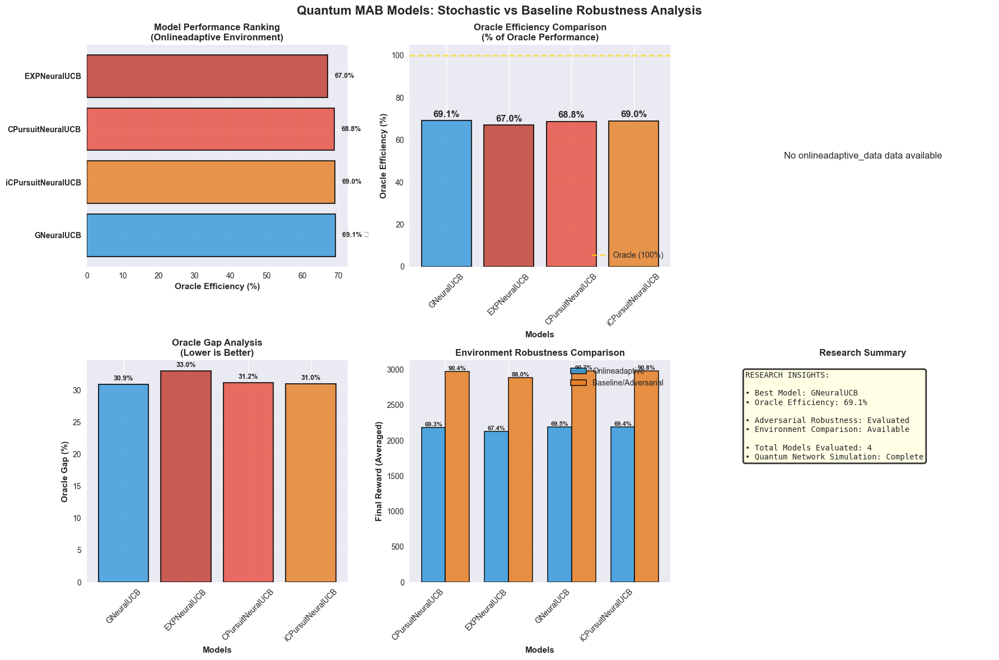


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Random

✅ COMPLETED: Random

Random COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: Random at scale 1.5
----------------------------------------------------------

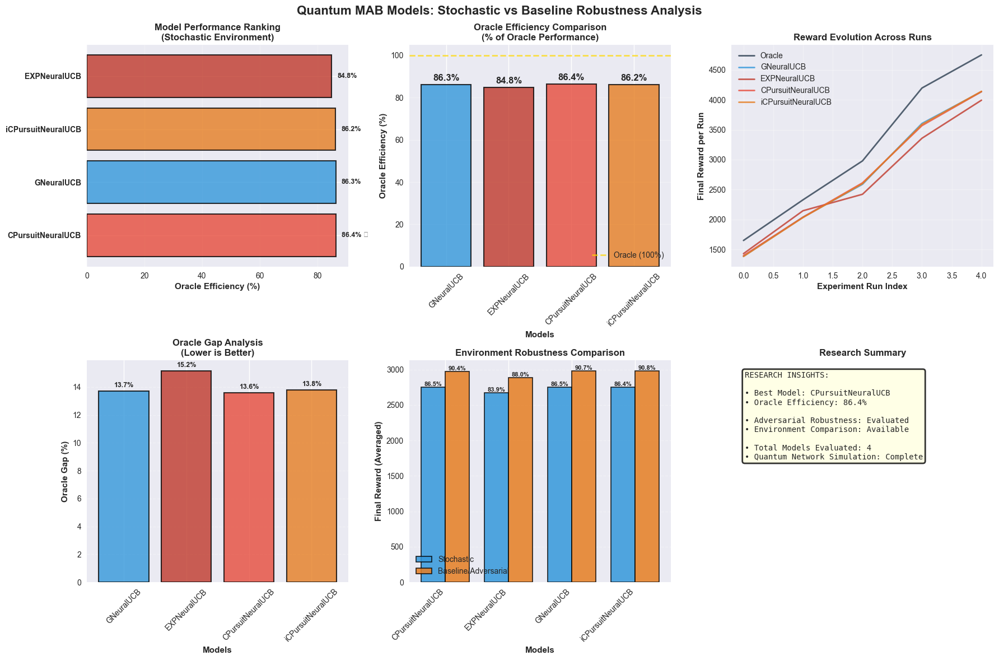


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	013.6%
	Winner Avg Efficiency: 	086.4%

Overall Models Performance:
	• CPursuitNeuralUCB: 	086.4% Efficiency 	(Won 1/5 experiments)
	• GNeuralUCB     : 	086.3% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	086.2% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	084.8% Efficiency 	(Won 2/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Random_stochastic_vs_baseline_20260306_024535.png


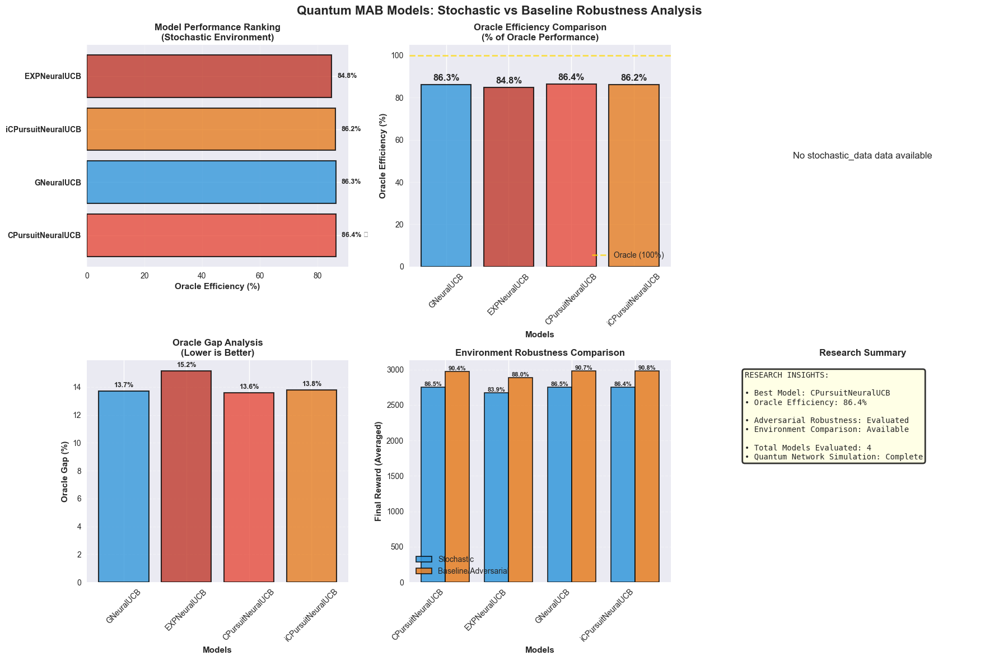


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	043.4%
	Winner Avg Efficiency: 	056.6%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	056.6% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	050.2% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.2% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.6% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Random_markov_vs_baseline_20260306_024535.png


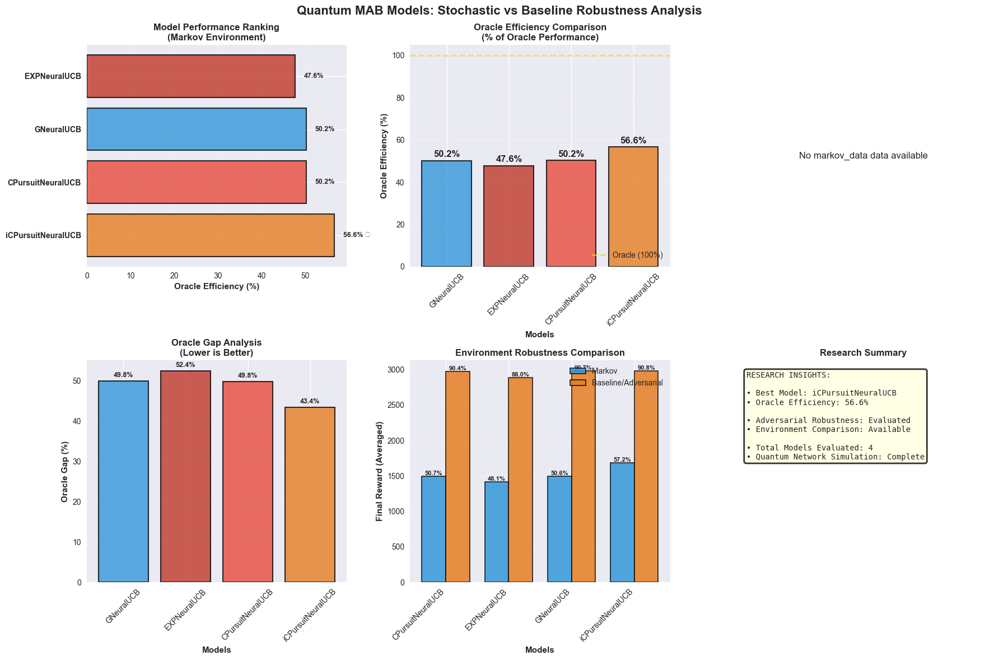


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	029.7%
	Winner Avg Efficiency: 	070.3%

Overall Models Performance:
	• CPursuitNeuralUCB: 	070.3% Efficiency 	(Won 2/5 experiments)
	• GNeuralUCB     : 	069.8% Efficiency 	(Won 1/5 experiments)
	• iCPursuitNeuralUCB: 	069.6% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	069.1% Efficiency 	(Won 2/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Random_adaptive_vs_baseline_20260306_024535.png


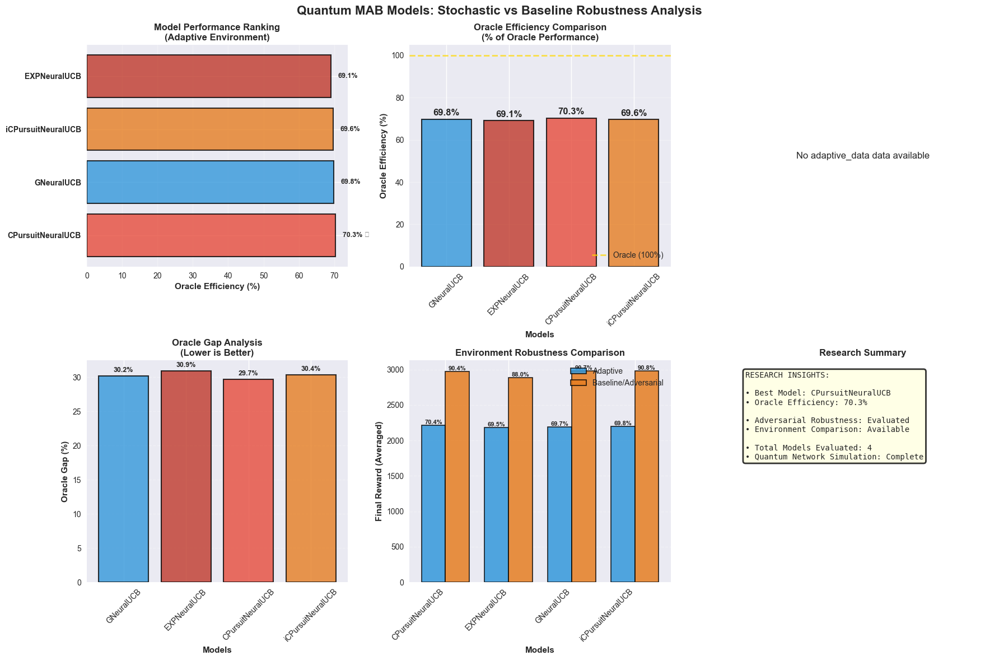


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• GNeuralUCB     : 	069.1% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	068.8% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	067.0% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Random_onlineadaptive_vs_baseline_20260306_024535.png


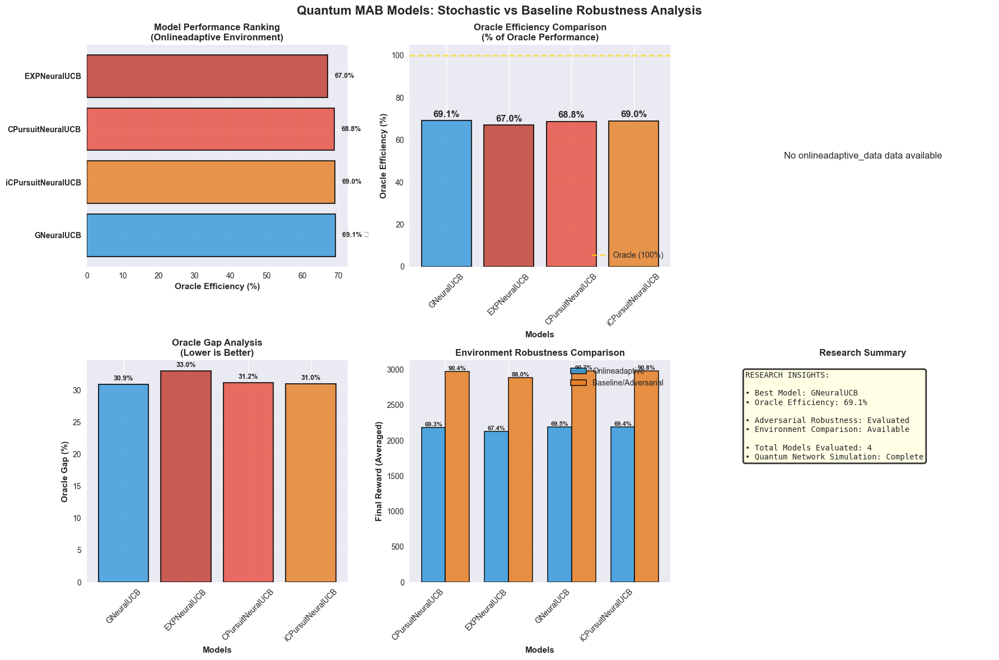


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3180.827
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2750.768
  • Oracle Efficiency: 86.3%
  • Oracle Gap: 13.7%
  • Classification: GOOD

EXPNeuralUCB:
  • Stochastic Performance: 2669.922
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2750.385
  • Oracle Efficiency: 86.4%
  • Oracle Gap: 13.6%
  • Classification: GOOD
  ★ WINNER ★

iCPursuitNeuralUCB:
  • Stochastic Performance: 2748.861
  • Oracle Efficiency: 86.2%
  • Oracle Gap: 13.8%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Random

✅ COMPLETED: Random

Random COMPLETED SUCCESSFULLY

----------------------------------------------------------------------
Preparing: Random at scale 2
------------------------------------------------------------

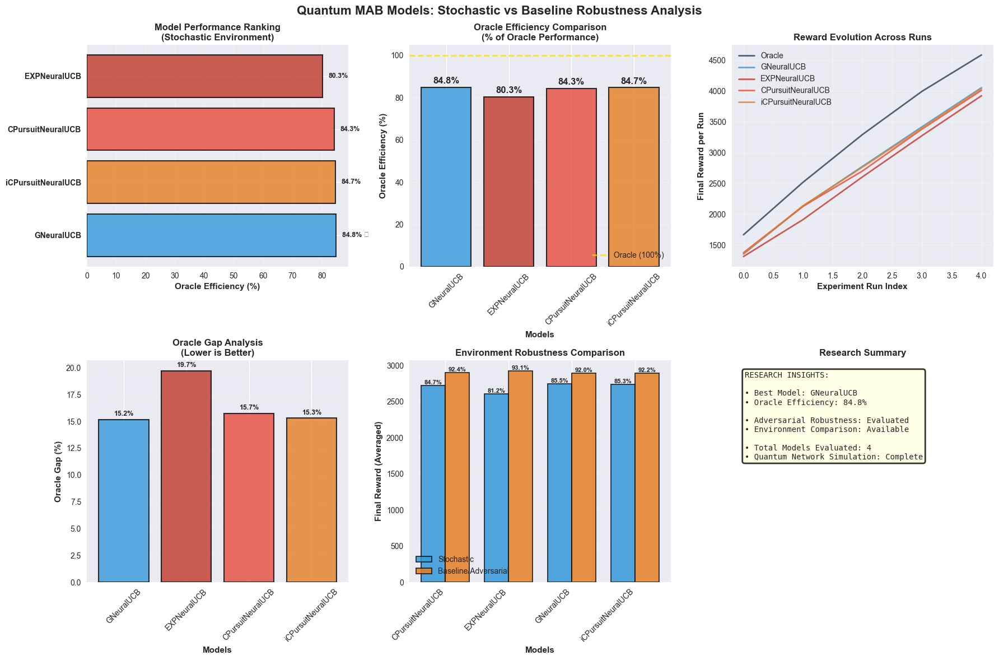


📊 Generating plots for scenario: STOCHASTIC

DETAILED SCENARIO PERFORMANCE: STOCHASTIC
SCENARIO: 	STOCHASTIC RANDOM FAILURES
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 3/5 experiments)
	Winner Avg Gap: 	015.2%
	Winner Avg Efficiency: 	084.8%

Overall Models Performance:
	• GNeuralUCB     : 	084.8% Efficiency 	(Won 3/5 experiments)
	• iCPursuitNeuralUCB: 	084.7% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	084.3% Efficiency 	(Won 1/5 experiments)
	• EXPNeuralUCB   : 	080.3% Efficiency 	(Won 0/5 experiments)
Creating  stochastic vs basline comparison visualization...
✓ Comparison plot saved as: Random_stochastic_vs_baseline_20260306_025208.png


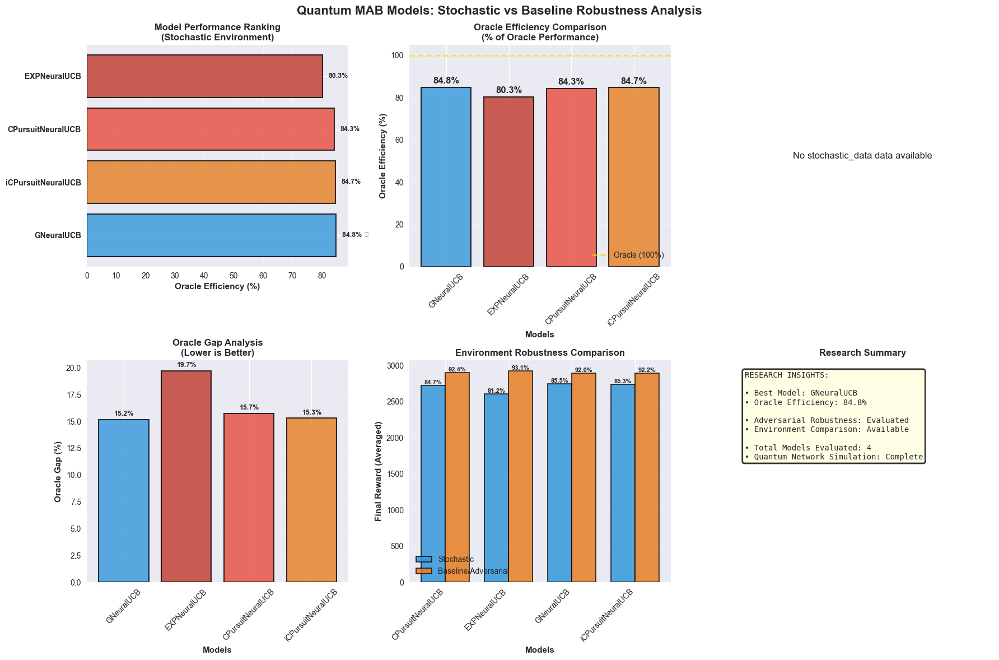


📊 Generating plots for scenario: MARKOV

DETAILED SCENARIO PERFORMANCE: MARKOV
SCENARIO: 	MARKOV ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	iCPursuitNeuralUCB (Won 5/5 experiments)
	Winner Avg Gap: 	041.9%
	Winner Avg Efficiency: 	058.1%

Overall Models Performance:
	• iCPursuitNeuralUCB: 	058.1% Efficiency 	(Won 5/5 experiments)
	• CPursuitNeuralUCB: 	051.1% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	050.5% Efficiency 	(Won 0/5 experiments)
	• EXPNeuralUCB   : 	047.1% Efficiency 	(Won 0/5 experiments)
Creating  markov vs basline comparison visualization...
✓ Comparison plot saved as: Random_markov_vs_baseline_20260306_025208.png


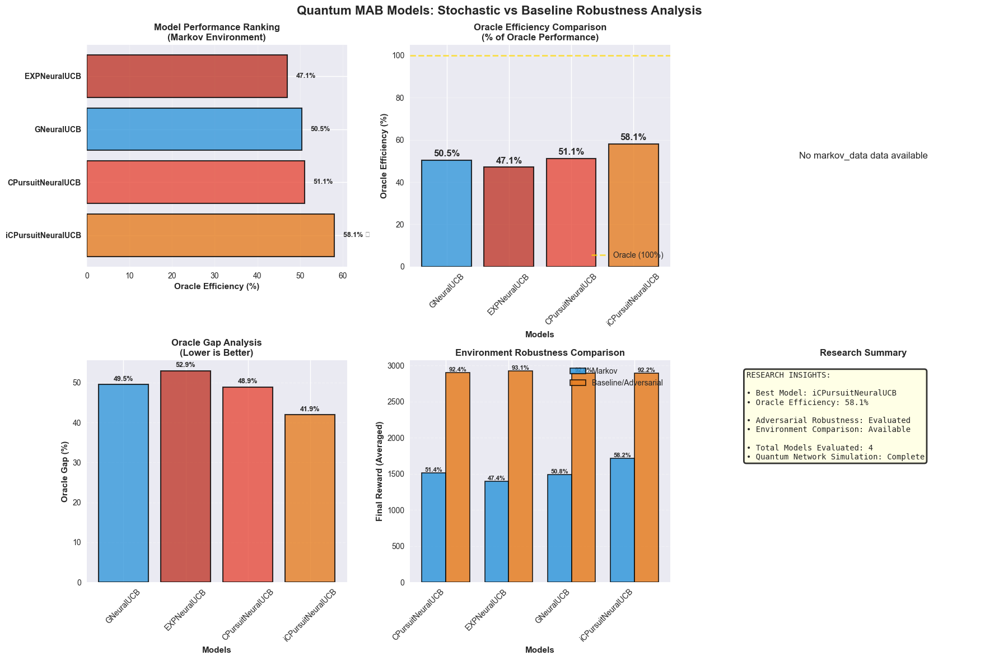


📊 Generating plots for scenario: ADAPTIVE

DETAILED SCENARIO PERFORMANCE: ADAPTIVE
SCENARIO: 	ADAPTIVE ADVERSARIAL ATTACK
----------------------------------------
Recommended Model: 	GNeuralUCB (Won 1/5 experiments)
	Winner Avg Gap: 	030.6%
	Winner Avg Efficiency: 	069.4%

Overall Models Performance:
	• GNeuralUCB     : 	069.4% Efficiency 	(Won 1/5 experiments)
	• CPursuitNeuralUCB: 	069.3% Efficiency 	(Won 2/5 experiments)
	• EXPNeuralUCB   : 	068.9% Efficiency 	(Won 2/5 experiments)
	• iCPursuitNeuralUCB: 	068.6% Efficiency 	(Won 0/5 experiments)
Creating  adaptive vs basline comparison visualization...
✓ Comparison plot saved as: Random_adaptive_vs_baseline_20260306_025208.png


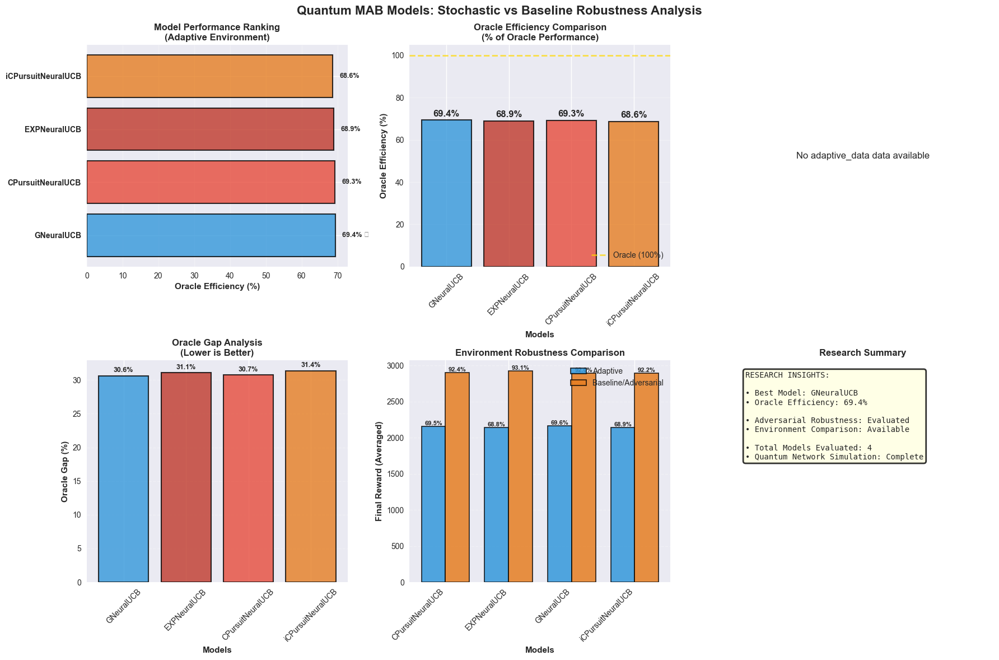


📊 Generating plots for scenario: ONLINEADAPTIVE

DETAILED SCENARIO PERFORMANCE: ONLINEADAPTIVE
SCENARIO: 	ONLINE ADAPTIVE ATTACK
----------------------------------------
Recommended Model: 	CPursuitNeuralUCB (Won 2/5 experiments)
	Winner Avg Gap: 	030.9%
	Winner Avg Efficiency: 	069.1%

Overall Models Performance:
	• CPursuitNeuralUCB: 	069.1% Efficiency 	(Won 2/5 experiments)
	• iCPursuitNeuralUCB: 	069.0% Efficiency 	(Won 0/5 experiments)
	• GNeuralUCB     : 	068.9% Efficiency 	(Won 2/5 experiments)
	• EXPNeuralUCB   : 	064.9% Efficiency 	(Won 1/5 experiments)
Creating  onlineadaptive vs basline comparison visualization...
✓ Comparison plot saved as: Random_onlineadaptive_vs_baseline_20260306_025208.png


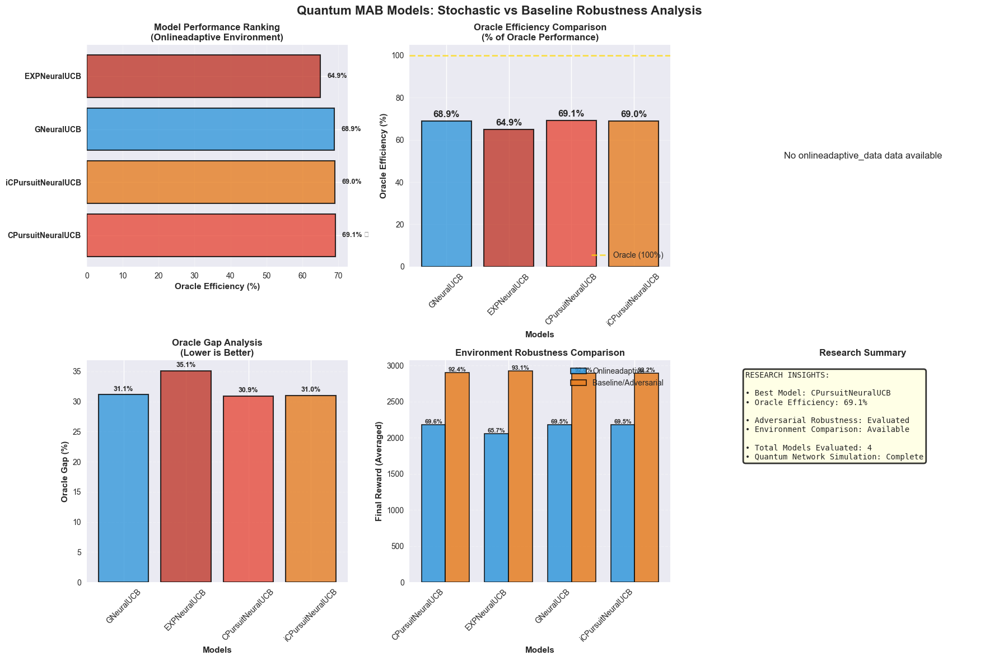


✓ All scenario plots generated!

STOCHASTIC PERFORMANCE METRICS

Oracle:
  • Stochastic Performance: 3211.697
  • Oracle Efficiency: 0.0%
  • Oracle Gap: 0.0%
  • Classification: NEEDS IMPROVEMENT

GNeuralUCB:
  • Stochastic Performance: 2746.884
  • Oracle Efficiency: 84.8%
  • Oracle Gap: 15.2%
  • Classification: GOOD
  ★ WINNER ★

EXPNeuralUCB:
  • Stochastic Performance: 2606.340
  • Oracle Efficiency: 80.3%
  • Oracle Gap: 19.7%
  • Classification: GOOD

CPursuitNeuralUCB:
  • Stochastic Performance: 2719.929
  • Oracle Efficiency: 84.3%
  • Oracle Gap: 15.7%
  • Classification: GOOD

iCPursuitNeuralUCB:
  • Stochastic Performance: 2739.630
  • Oracle Efficiency: 84.7%
  • Oracle Gap: 15.3%
  • Classification: GOOD
[Logging Redirect Stopped]

🧹 Final cleanup for Random

✅ COMPLETED: Random

Random COMPLETED SUCCESSFULLY

ALL ALLOCATORS COMPLETE!


In [6]:
# ============================================================
# Cell 2: Allocator + ExperimentConfiguration for Paper #2
# ============================================================
importlib.reload(qubit_allocator)
importlib.reload(experiment_config)
importlib.reload(multi_run_evaluator)

from daqr.core.quantum_physics              import *
from daqr.core.qubit_allocator              import (
                                                QubitAllocator,
                                                RandomQubitAllocator,
                                                DynamicQubitAllocator,
                                                ThompsonSamplingAllocator
                                            )

from daqr.evaluation.allocator_runner       import AllocatorRunner
from daqr.evaluation.multi_run_evaluator    import MultiRunEvaluator
from daqr.config.experiment_config          import ExperimentConfiguration



print("=" * 70, "\nPAPER #2 QUANTUM MAB MODELS EVALUATION FRAMEWORK - STOCHASTIC FOCUS\n", "=" * 70)
# ------------------------------------------------------------
# 1) Allocator selection (Paper #2: start with fixed baseline)
# ------------------------------------------------------------
# You can swap these as needed:
# allocator = RandomQubitAllocator(epsilon=0.5, seed=42)        # 50-50 mix
# allocator = RandomQubitAllocator(epsilon=0.1, seed=42)        # mostly baseline
# allocator = RandomQubitAllocator(epsilon=0.0, seed=42)        # deterministic
# allocator = DynamicQubitAllocator(seed=42)                    # dynamic UCB
# allocator = ThompsonSamplingAllocator(seed=42)                # Thompson

allocator_type =    "Random"
ALLOCATORS = ["Random"]

# ------------------------------------------------------------
# 2) Derive run parameters from FRAMEWORK_CONFIG (Cell 1)
# ------------------------------------------------------------
# current_frames      = FRAMEWORK_CONFIG['base_frames'] 
# frame_step          = FRAMEWORK_CONFIG['frame_step']
# attack_intensity    = FRAMEWORK_CONFIG['intensity']
# current_experiments = FRAMEWORK_CONFIG['exp_num']

attack_intensity    = FRAMEWORK_CONFIG['intensity']
current_frames      = 50
frame_step          = 50
current_experiments = 1
last_backup         = True
base_cap            = False
overwrite           = False

# PHYSICS_MODELS = ['paper2', 'default']  # Set to ['default', 'paper2'] to test both
ATTACK_SCENARIOS = ['stochastic']  # Start simple, expand later
PHYSICS_MODELS = ['paper2']
# PHYSICS_MODELS = ['default']
SCALES = [1, 1.5, 2]
RUNS = [5]


print("\n" + "=" * 70, "\n🎯 QUANTUM ROUTING ALLOCATOR EVALUATION\n", "=" * 70)
print(f"Total Allocators to Test:   {len(ALLOCATORS)}")
print(f"Physics Models:             {PHYSICS_MODELS}")
print(f"Allocators:                 {ALLOCATORS}")
print(f"Scales:                     {SCALES}")
print(f"Runs:                       {RUNS}")
print("=" * 70)

# Run allocator
for allocator_type in ALLOCATORS:
    print(f"\n{'='*70}")
    print(f"RUNNING: {allocator_type} on Paper 2 (Chaudhary et al. 2023 - Quantum MAB)")
    print('='*70)

    for scale in SCALES:
        print(f"\n{'-'*70}")
        print(f"Preparing: {allocator_type} at scale {scale}")
        print(f"{'-'*70}")

        for physics_model in PHYSICS_MODELS:
            print(f"\n🔧 Generating physics parameters for model: {physics_model}") 
            try:
                # Create isolated runner instance
                custom_config = ExperimentConfiguration(
                    env_type=FRAMEWORK_CONFIG['main_env'],
                    scenarios=test_scenarios,
                    use_last_backup=last_backup,
                    models=models,
                    attack_intensity=attack_intensity,
                    scale=scale,
                    base_capacity=base_cap,
                    overwrite=overwrite
                )

                alloc_runner = AllocatorRunner(
                    allocator_type=allocator_type,
                    physics_models=[physics_model],
                    framework_config=FRAMEWORK_CONFIG,
                    scales=[scale],
                    runs=RUNS,
                    models=models,
                    test_scenarios=test_scenarios,
                    config=custom_config
                )

                # Run with Paper 12 physics
                alloc_runner.run(get_physics_params_func=get_physics_params)
                print(f"\n{allocator_type} COMPLETED SUCCESSFULLY")

            except Exception as e:
                print(f"\n{allocator_type} FAILED: {e}")
                import traceback
                traceback.print_exc()

print("\n" + "=" * 70)
print("ALL ALLOCATORS COMPLETE!")
print("=" * 70)


## Multi-Environment Performance Analysis

### Complete Evaluation Matrix

This research extends beyond the primary stochastic-adversarial comparison to provide comprehensive algorithm assessment across the complete spectrum of operational environments, establishing a thorough empirical foundation for robustness evaluation.

### Environmental Test Framework

| Environment | Classification | Threat Characteristics | Analytical Purpose |
|-------------|---------------|----------------------|-------------------|
| `none` | Baseline | Deterministic optimal conditions | Theoretical performance ceiling |
| `stochastic` | Probabilistic | Uniform random failures | Standard operational baseline |
| `markov` | Adversarial | Memory-dependent strategic attacks | Oblivious adversarial model |
| `adaptive` | Adversarial | Feedback-driven strategic attacks | Responsive adversarial model |
| `onlineadaptive` | Adversarial | Real-time adaptive strategic attacks | Sophisticated adversarial model |

### Research Contributions

**Comprehensive Threat Model Coverage**
The evaluation framework addresses the complete spectrum of operational conditions, from optimal deterministic environments through increasingly sophisticated adversarial scenarios, providing unprecedented coverage of realistic deployment conditions.

**Graduated Adversarial Complexity Analysis**  
The systematic progression from oblivious to sophisticated adversarial models enables precise quantification of algorithm performance degradation as threat sophistication increases, revealing critical robustness thresholds.

**Cross-Environment Validation Protocol**
Consistent algorithm ranking across multiple environments validates robustness claims and identifies algorithms with stable performance characteristics independent of operational conditions.

**Empirical Robustness Quantification**
The multi-environment approach enables precise measurement of performance degradation rates, establishing quantitative robustness metrics that support theoretical predictions and practical deployment decisions.

### Methodological Significance

This comprehensive evaluation protocol addresses limitations in existing literature where algorithm assessment often focuses on narrow operational scenarios, providing the empirical foundation necessary for robust algorithm deployment in practical quantum network environments.